## Gráficos de Análise Exploratória de Dados (EDA) - NFTs Blue Chips - Histogramas, Gráficos de Linha, Boxplots, Gráficos de Áreas 

## Packages and libraries

In [1]:
!pip install plotnine

# importar pacotes
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import glob

import matplotlib.dates as mdates
import datetime

from plotnine import ggplot, aes
from plotnine.geoms import geom_point
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

## DataSet

### Sentença SQL realizada do Google BigQuery para NFT's Comuns


*  SELECT
  A.BLOCK_TIMESTAMP,
  A.FROM_ADDRESS,
  A.TO_ADDRESS,
  A.VALUE,
  A.TRANSACTION_HASH,
  B.NONCE,
  B.FROM_ADDRESS AS FROM_ADDRESS_BLOCKCHAIN,
  B.TO_ADDRESS AS TO_ADDRESS_BLOCKCHAIN,
  B.GAS,
  B.RECEIPT_GAS_USED
FROM
  `bigquery-public-data.crypto_ethereum.token_transfers` AS A
INNER JOIN
  `bigquery-public-data.crypto_ethereum.transactions` AS B
ON
  A.transaction_hash = B.HASH
WHERE
  A.TOKEN_ADDRESS = `#hash_nft_comum`
  AND A.BLOCK_TIMESTAMP >= (
  SELECT
    MIN(block_timestamp)
  FROM
    `bigquery-public-data.crypto_ethereum.contracts`
  WHERE
    address = `#hash_nft_comum`)
ORDER BY
  A.BLOCK_TIMESTAMP

O dataframe resultante da sentença SQL realizada no Google BigQuery contém informações sobre as transferências de tokens da blockchain Ethereum, relacionando as tabelas token_transfers e transactions. Os campos do dataframe são:

* BLOCK_TIMESTAMP: timestamp do bloco em que a transferência foi registrada.
* FROM_ADDRESS: endereço da carteira que enviou os tokens.
* TO_ADDRESS: endereço da carteira que recebeu os tokens.
* VALUE: valor da transferência em wei, a menor unidade de ether (a criptomoeda da Ethereum).
* TRANSACTION_HASH: hash da transação na blockchain Ethereum.
* NONCE: número de sequência da transação na carteira que a criou.
* FROM_ADDRESS_BLOCKCHAIN: endereço da carteira que enviou a transação na blockchain Ethereum.
* TO_ADDRESS_BLOCKCHAIN: endereço da carteira que recebeu a transação na blockchain Ethereum.
* GAS: quantidade de gas (unidade de custo de processamento na Ethereum) usada pela transação.
* RECEIPT_GAS_USED: quantidade de gas usada para executar a transferência de tokens.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
def lista_df():
  # Crie uma lista vazia para armazenar os dataframes
  df_list = []

  # Localize todos os arquivos CSV no diretório atual
  for filename in glob.glob("/content/drive/MyDrive/Dataset/NFT/CSV/2023/Blue_Chips/*.csv"):
      # Leia o arquivo CSV em um dataframe
      df = pd.read_csv(filename)
      # Adicione o dataframe à lista
      df_list.append(df)

  return df_list

In [4]:
list_df_blue = []
list_df_blue = lista_df()
len(list_df_blue)

20

In [5]:
tipos_dos_elementos = set(type(elemento) for elemento in list_df_blue)
print(tipos_dos_elementos)

{<class 'pandas.core.frame.DataFrame'>}


In [6]:
for i in range(len(list_df_blue)):

    df = list_df_blue[i]

    # Convertendo a coluna 'BLOCK_TIMESTAMP' para o tipo datetime
    df['BLOCK_TIMESTAMP'] = pd.to_datetime(df['BLOCK_TIMESTAMP'])

    # Criando uma nova coluna com a data (sem o horário) dos blocos
    df['BLOCK_DATE'] = df['BLOCK_TIMESTAMP'].dt.date

    # Exclui registros que possuem o endereço '0x0000000000000000000000000000000000000000' na coluna FROM_ADDRESS, pois siginifica a criação do token
    df.drop(df[df['FROM_ADDRESS'] == '0x0000000000000000000000000000000000000000'].index, inplace=True)

In [ ]:
# df_concatenado = pd.concat(list_df_blue)

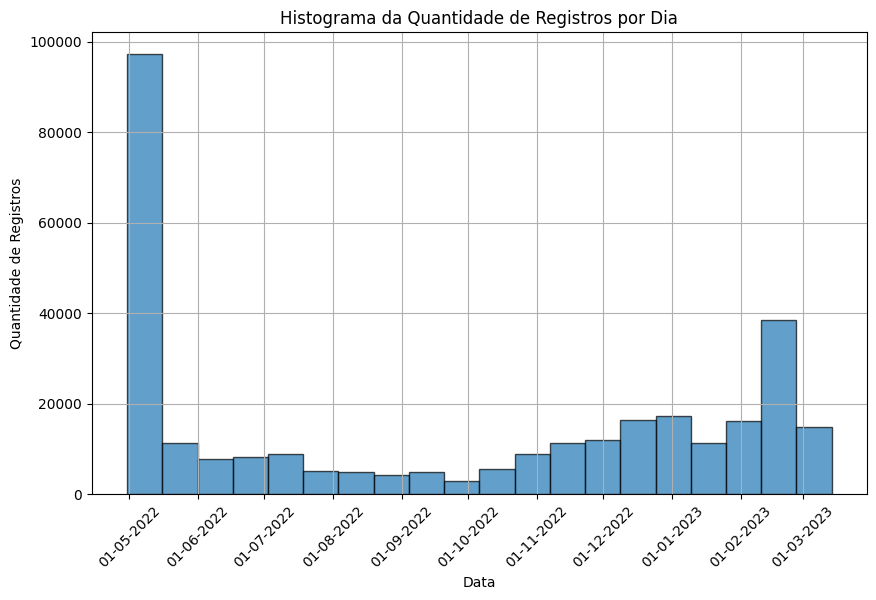

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Apenas o primeiro DataFrame da lista
df = list_df_blue[0]

# Configurando o tamanho da figura
plt.figure(figsize=(10, 6))

# Criando o histograma com base na coluna 'BLOCK_DATE'
df['BLOCK_DATE'] = pd.to_datetime(df['BLOCK_DATE'])
df['BLOCK_DATE'].hist(bins=20, edgecolor='black', alpha=0.7)

# Configurando rótulos do eixo x e y
plt.xlabel('Data')
plt.ylabel('Quantidade de Registros')

# Girando os rótulos do eixo X em 45 graus
plt.xticks(rotation=45)

# Ajustando a formatação das datas no eixo X
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

# Adicionando título ao gráfico
plt.title('Histograma da Quantidade de Registros por Dia')

# Exibindo o gráfico
plt.show()


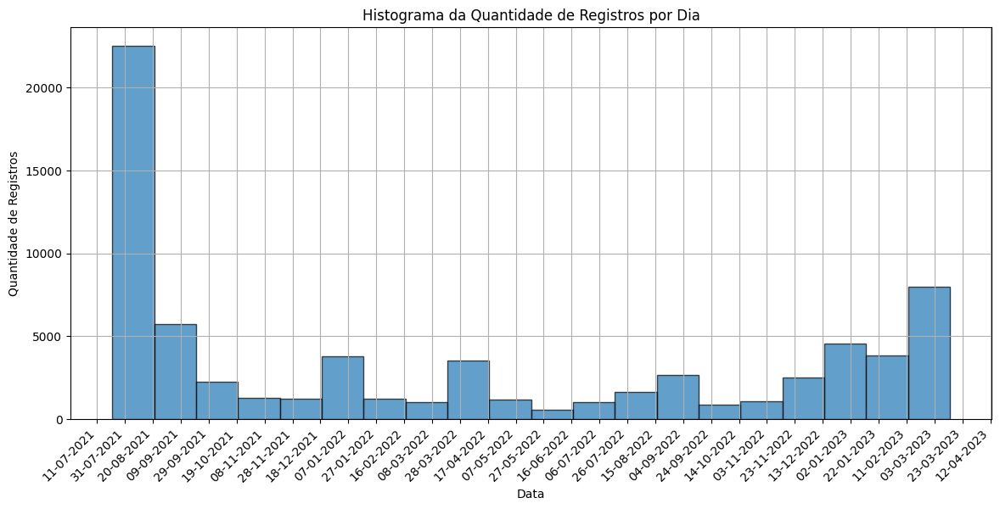

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Apenas o primeiro DataFrame da lista
df = list_df_blue[1]

# Configurando o tamanho da figura
plt.figure(figsize=(14, 6))

# Criando o histograma com base na coluna 'BLOCK_DATE'
df['BLOCK_DATE'] = pd.to_datetime(df['BLOCK_DATE'])
df['BLOCK_DATE'].hist(bins=20, edgecolor='black', alpha=0.7)

# Configurando rótulos do eixo x e y
plt.xlabel('Data')
plt.ylabel('Quantidade de Registros')

# Girando os rótulos do eixo X em 45 graus
plt.xticks(rotation=45, ha='right')

# Ajustando a formatação das datas no eixo X
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=20))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

# Adicionando título ao gráfico
plt.title('Histograma da Quantidade de Registros por Dia')

# Exibindo o gráfico
plt.show()


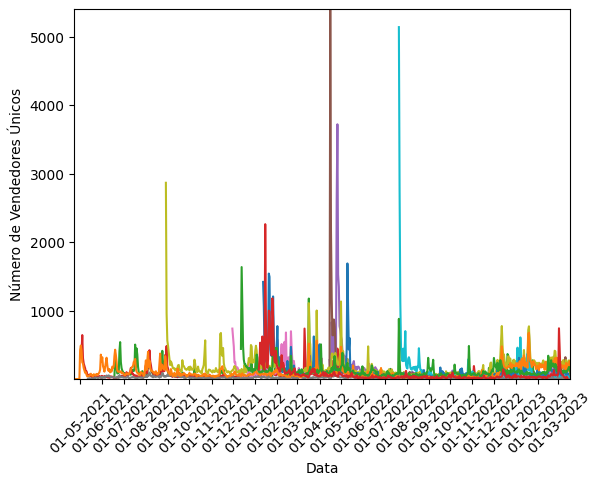

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [2,3,4,5,6,8,10,11,12,13,15,17,18,19]

# Criar uma figura
fig, ax = plt.subplots()

# Listas para armazenar os valores mínimos e máximos de vendedores
min_values = []
max_values = []

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_blue[i]

    # Agrupar os dados por data e FROM_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])['FROM_ADDRESS'].nunique()

    # Calcular o valor mínimo e máximo de vendedores
    min_values.append(unique_users.groupby('BLOCK_DATE').count().min())
    max_values.append(unique_users.groupby('BLOCK_DATE').count().max())

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line', label=f'NFT Blue Chip {i}')

# Configurar os rótulos do eixo x para exibir dia, mês e ano
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

# Definir os limites do eixo x com base nas datas mínimas e máximas dos índices selecionados
plt.xlim(min(df['BLOCK_DATE'].min() for i, df in enumerate(list_df_blue) if i in indices_selecionados),
         max(df['BLOCK_DATE'].max() for i, df in enumerate(list_df_blue) if i in indices_selecionados))

# Definir os limites do eixo y com base nos valores mínimos e máximos
plt.ylim(min(min_values), max(max_values))

# Remover rótulos dos eixos x e y
plt.xticks(rotation=45)
plt.xlabel('Data')
plt.ylabel('Número de Vendedores Únicos')

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.35, 1))

# Desativar o grid
plt.grid(False)

# Exibir o gráfico
plt.show()


Arquivo 1


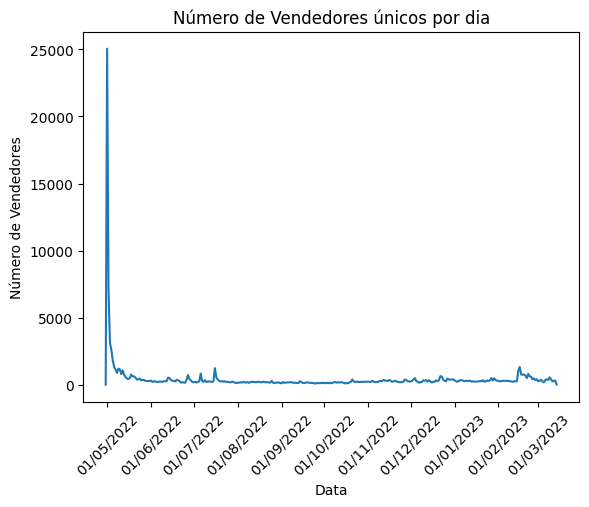

Arquivo 2


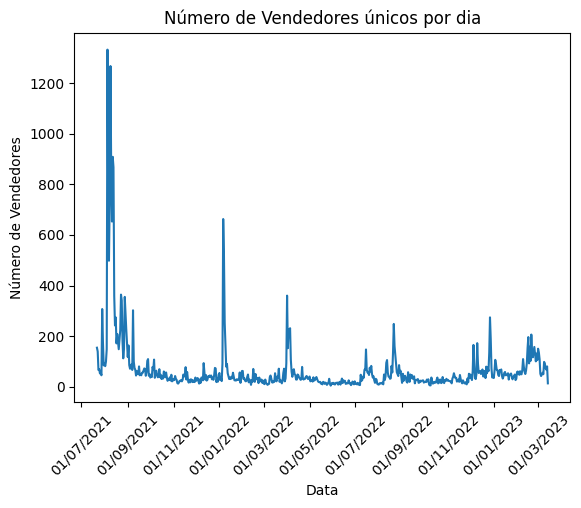

Arquivo 3


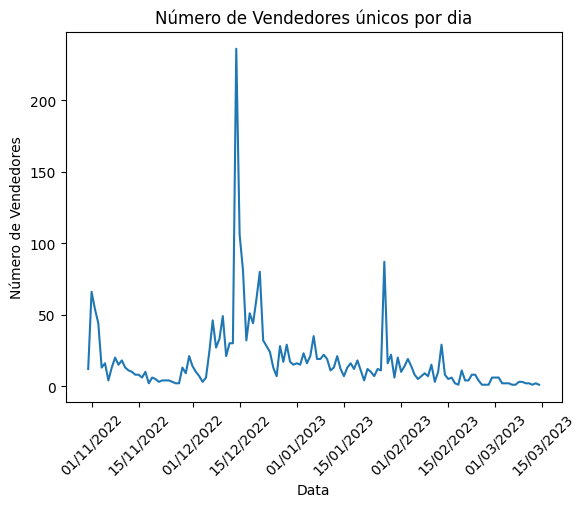

Arquivo 4


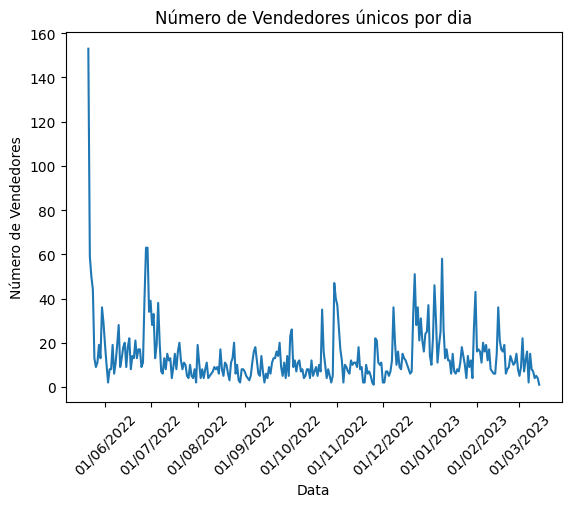

Arquivo 5


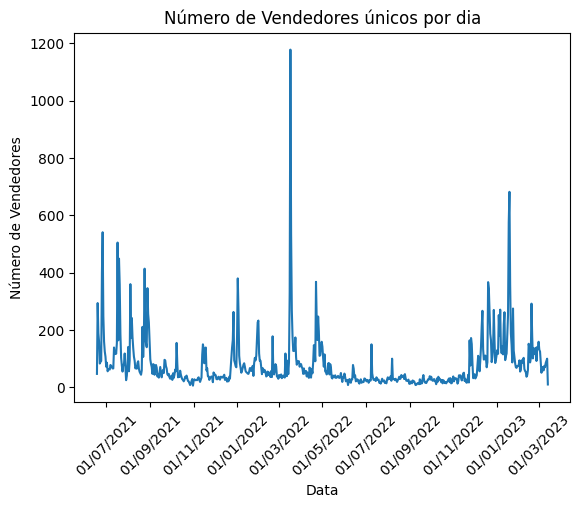

Arquivo 6


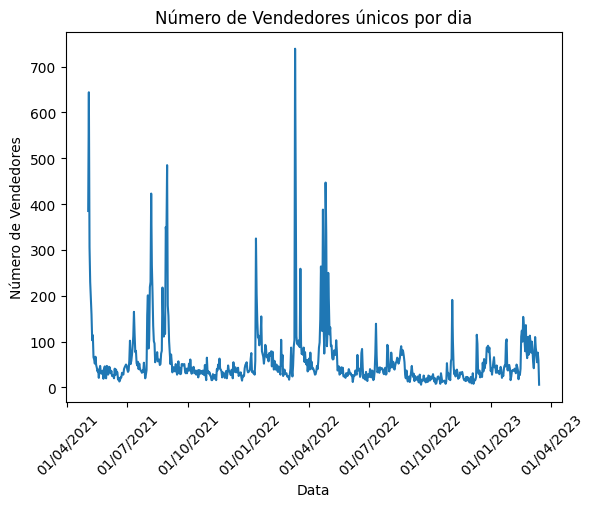

Arquivo 7


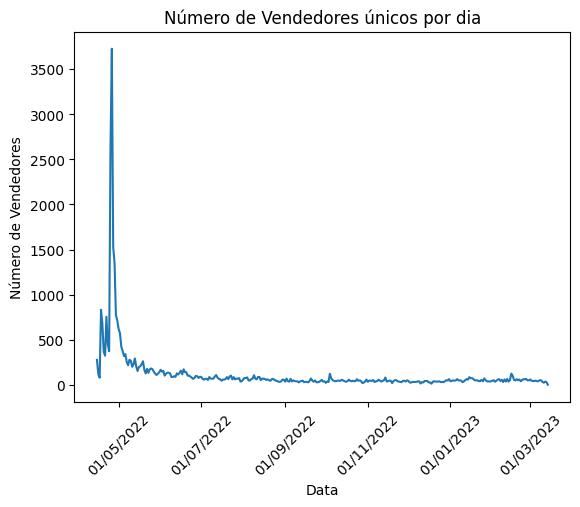

Arquivo 8


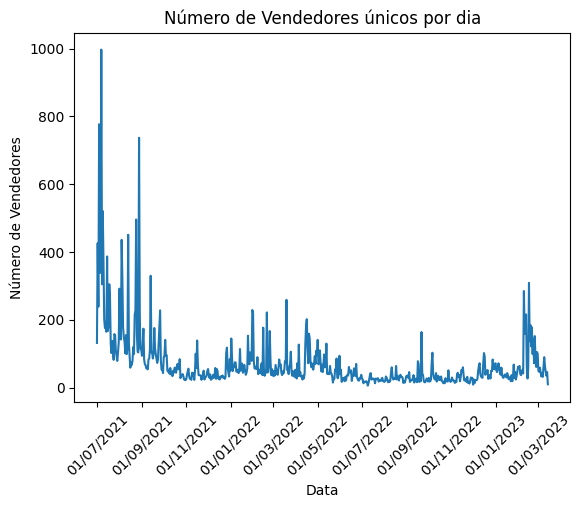

Arquivo 9


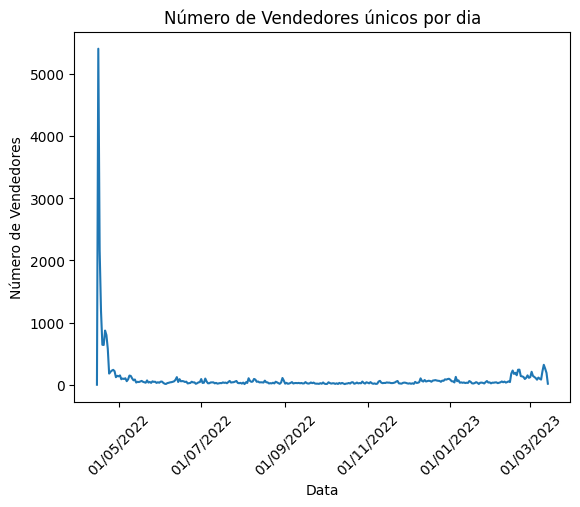

Arquivo 10


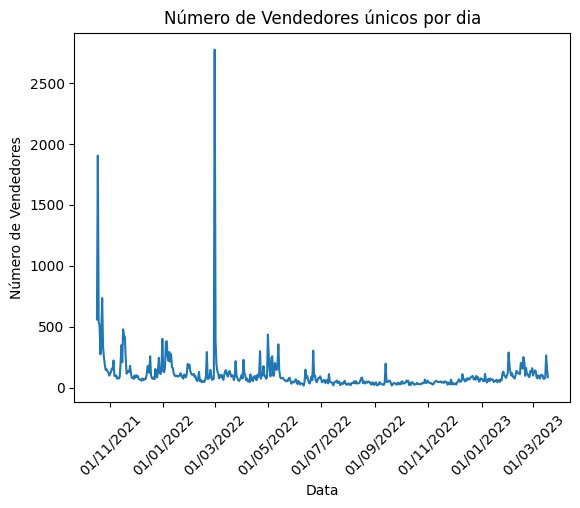

Arquivo 11


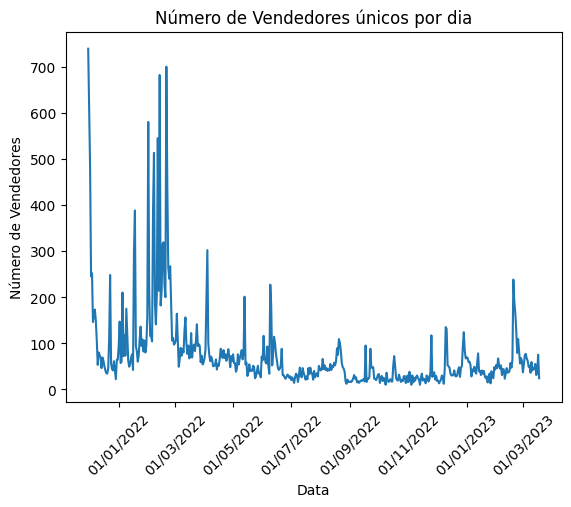

Arquivo 12


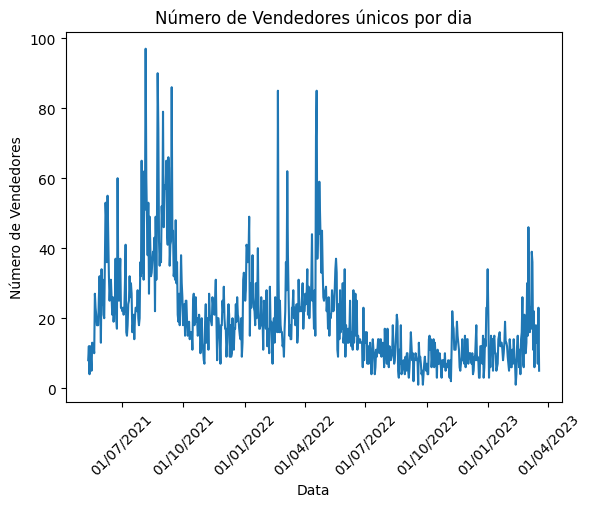

Arquivo 13


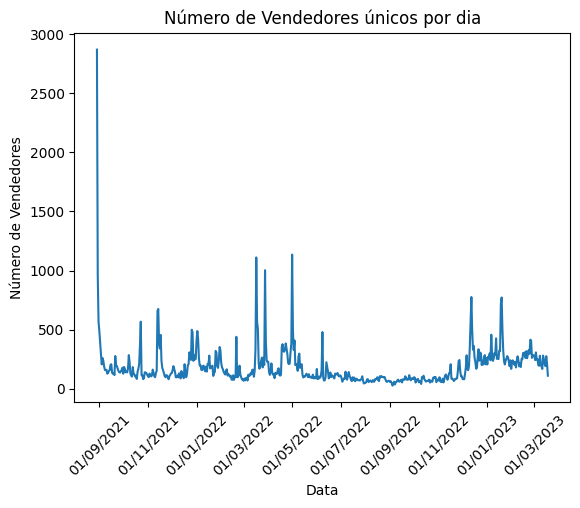

Arquivo 14


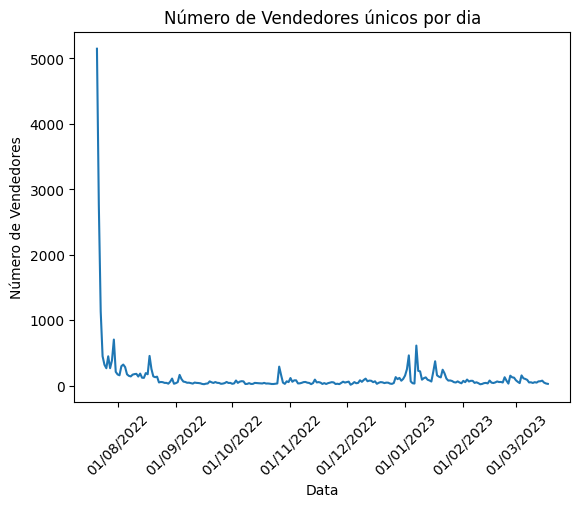

Arquivo 15


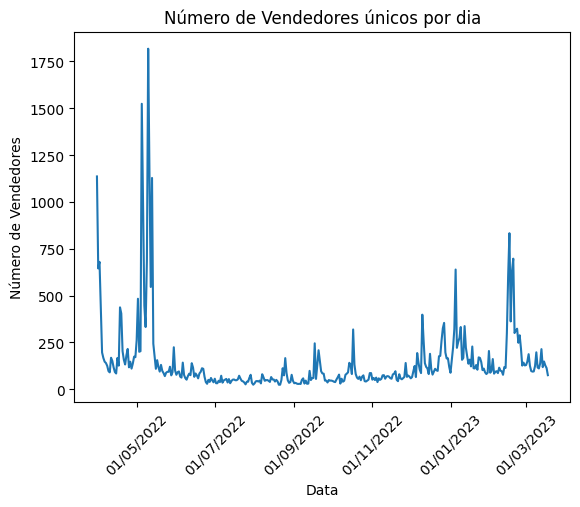

Arquivo 16


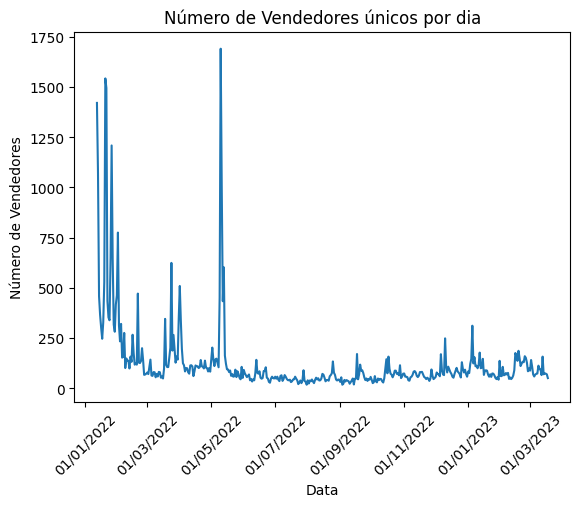

Arquivo 17


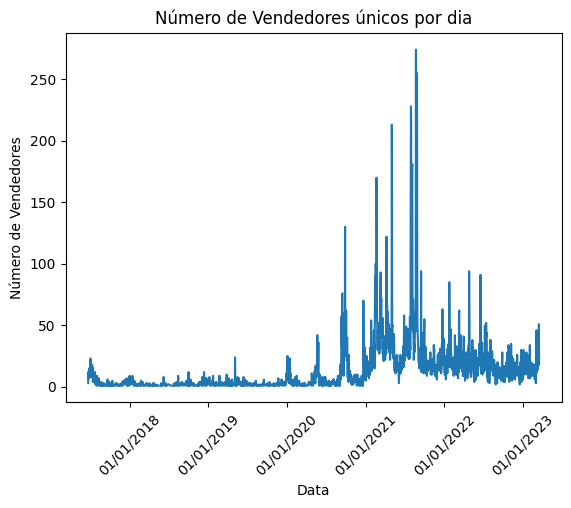

Arquivo 18


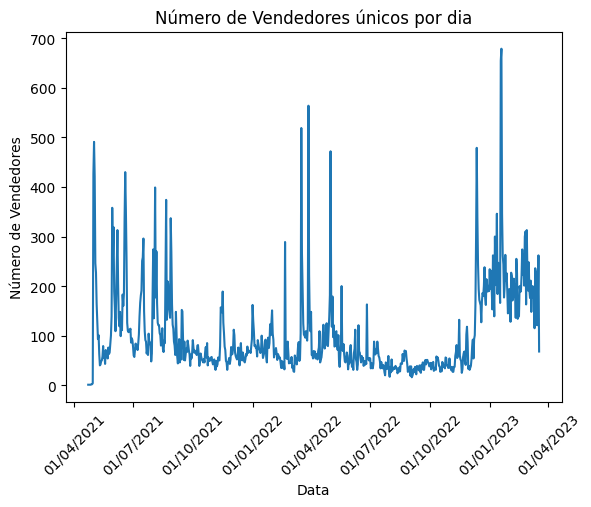

Arquivo 19


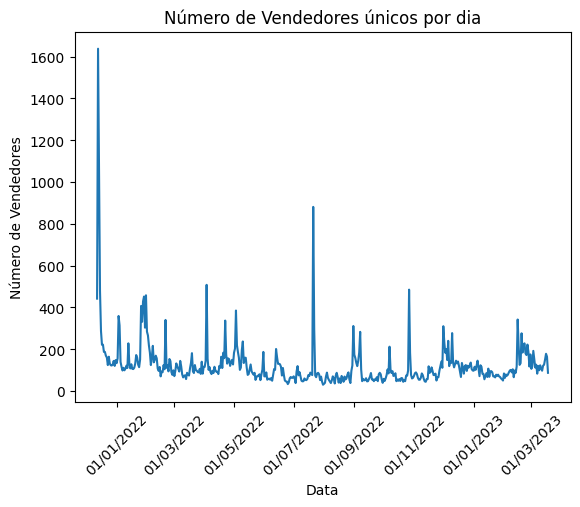

Arquivo 20


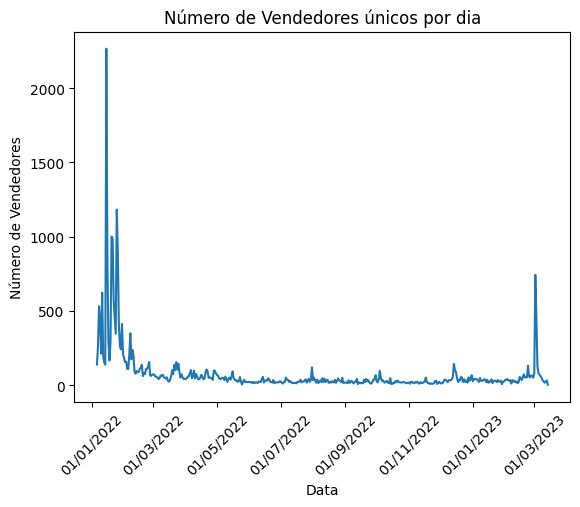

In [ ]:
for i in range(len(list_df_blue)):
    df = list_df_blue[i]

    # Agrupar os dados por data e FROM_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])['FROM_ADDRESS'].nunique()

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line')

    # Ajustar os rótulos do eixo X
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%Y'))
    plt.xticks(rotation=45)

    plt.title('Número de Vendedores únicos por dia')
    plt.xlabel('Data')
    plt.ylabel('Número de Vendedores')
    print("Arquivo " + str(i+1))
    plt.show()

In [ ]:
num_sellers = []
num_buyers = []

for i in range(len(list_df_blue)):
  df = list_df_blue[i]

# agrupa os dados pela coluna 'BLOCK_DATE' e 'FROM_ADDRESS'
  grouped_from = df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])

# agrupa os dados pela coluna 'BLOCK_DATE' e 'TO_ADDRESS'
  grouped_to = df.groupby(['BLOCK_DATE', 'TO_ADDRESS'])

# conta o número de vendedores únicos em cada grupo
  unique_sellers = grouped_from.size().reset_index(name='count')

# conta o número de compradores únicos em cada grupo
  unique_buyers = grouped_to.size().reset_index(name='count')

# calcula a média de vendedores únicos por dia
  mean_unique_sellers_per_day = unique_sellers.groupby('BLOCK_DATE')['FROM_ADDRESS'].nunique().mean()
  num_sellers.append(mean_unique_sellers_per_day)

# calcula a média de compradores únicos por dia
  mean_unique_buyers_per_day = unique_buyers.groupby('BLOCK_DATE')['TO_ADDRESS'].nunique().mean()
  num_buyers.append(mean_unique_buyers_per_day)


# Cálculo das médias
media_sellers = sum(num_sellers) / len(num_sellers)
media_buyers = sum(num_buyers) / len(num_buyers)
print('Média de vendedores únicos:', media_sellers)
print('Média de compradores únicos:', media_buyers)

Média de vendedores únicos: 101.20583374001114
Média de compradores únicos: 96.60318800092739


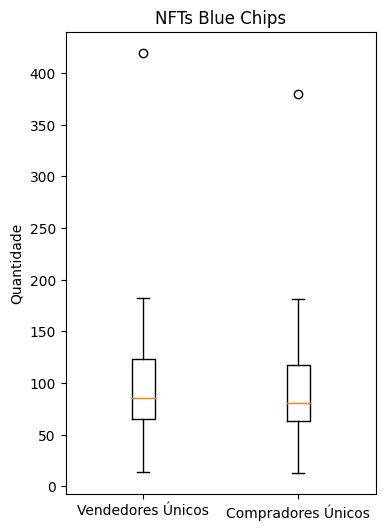

In [ ]:
# Plotar boxplot
plt.figure(figsize=(4,6)) # define uma figura com 8 polegadas de largura e 6 polegadas de altura

plt.boxplot([num_sellers, num_buyers])
plt.xticks([1, 2], ['Vendedores Únicos', 'Compradores Únicos'])
plt.title('NFTs Blue Chips')
plt.ylabel('Quantidade')
plt.show()

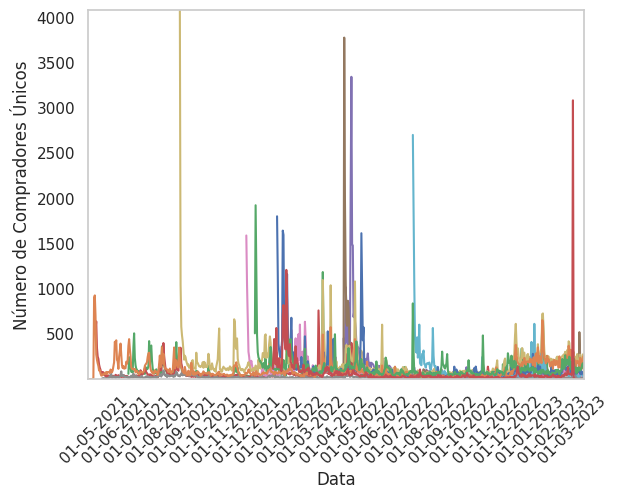

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [2,3,4,5,6,8,10,11,12,13,15,17,18,19]

# Criar uma figura
fig, ax = plt.subplots()

# Listas para armazenar os valores mínimos e máximos de vendedores
min_values = []
max_values = []

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_blue[i]

    # Agrupar os dados por data e TO_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'TO_ADDRESS'])['TO_ADDRESS'].nunique()

    # Calcular o valor mínimo e máximo de vendedores
    min_values.append(unique_users.groupby('BLOCK_DATE').count().min())
    max_values.append(unique_users.groupby('BLOCK_DATE').count().max())

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line', label=f'NFT Blue Chip {i}')

# Configurar os rótulos do eixo x para exibir dia, mês e ano
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

# Definir os limites do eixo x com base nas datas mínimas e máximas dos índices selecionados
plt.xlim(min(df['BLOCK_DATE'].min() for i, df in enumerate(list_df_blue) if i in indices_selecionados),
         max(df['BLOCK_DATE'].max() for i, df in enumerate(list_df_blue) if i in indices_selecionados))

# Definir os limites do eixo y com base nos valores mínimos e máximos
plt.ylim(min(min_values), max(max_values))

# Remover rótulos dos eixos x e y
plt.xticks(rotation=45)
plt.xlabel('Data')
plt.ylabel('Número de Compradores Únicos')

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.35, 1))

# Desativar o grid
plt.grid(False)

# Exibir o gráfico
plt.show()


Arquivo 1


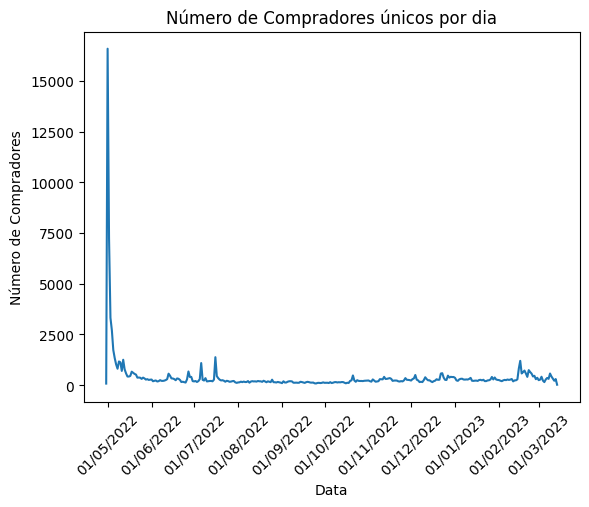

Arquivo 2


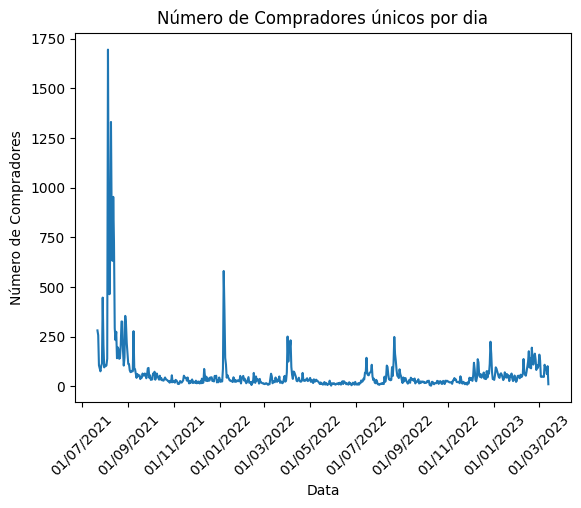

Arquivo 3


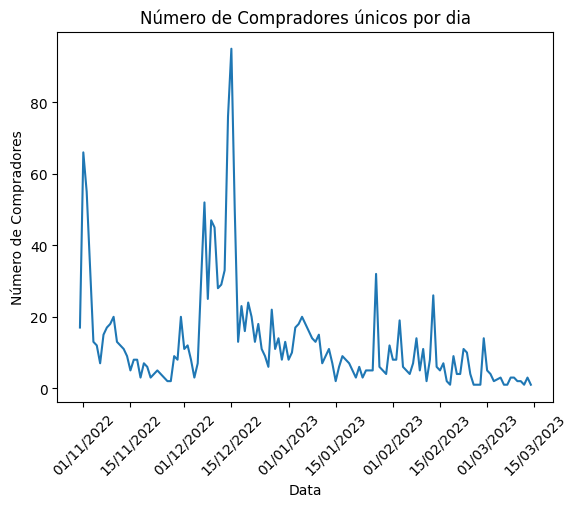

Arquivo 4


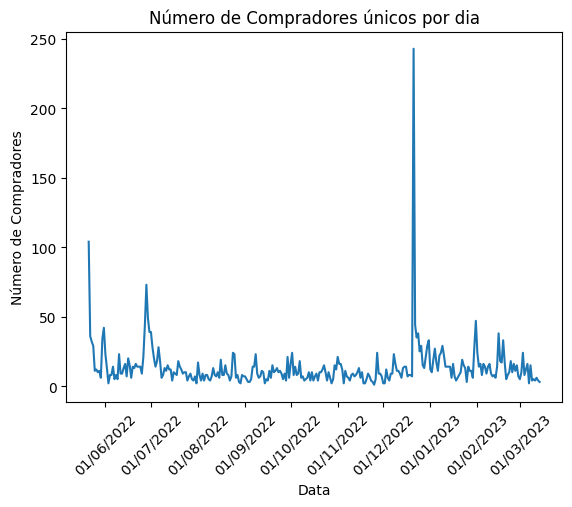

Arquivo 5


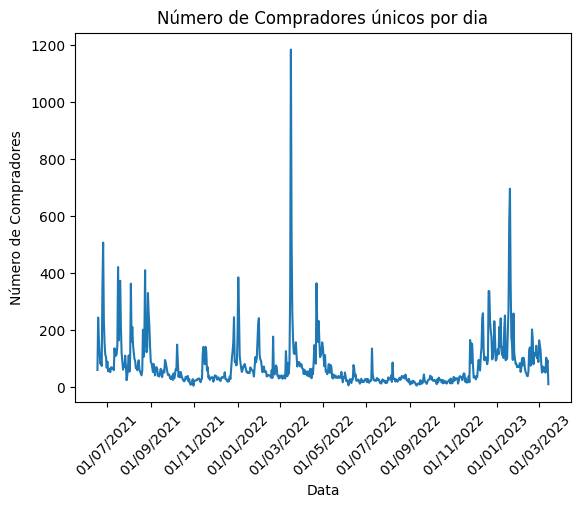

Arquivo 6


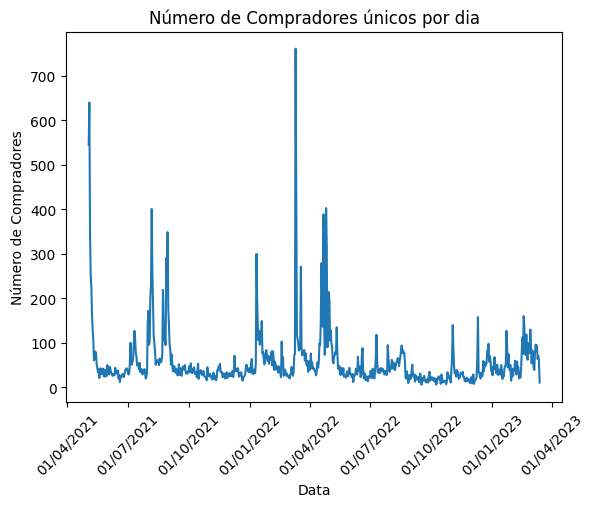

Arquivo 7


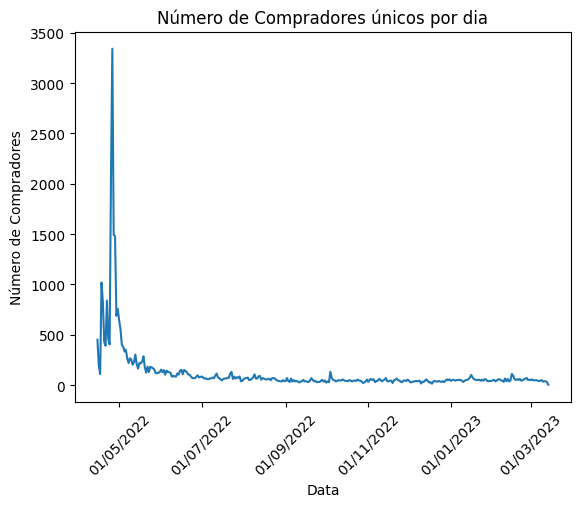

Arquivo 8


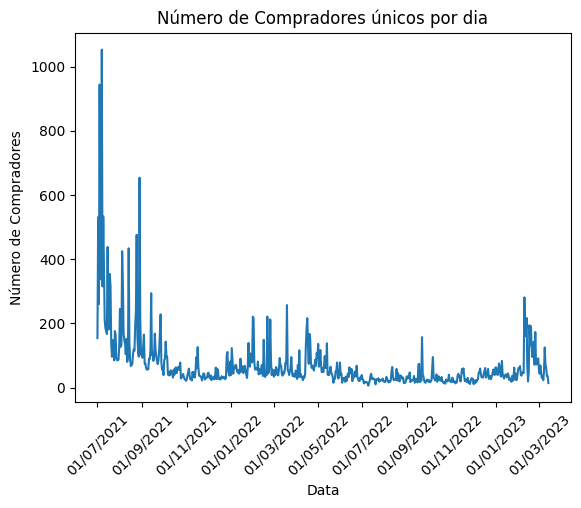

Arquivo 9


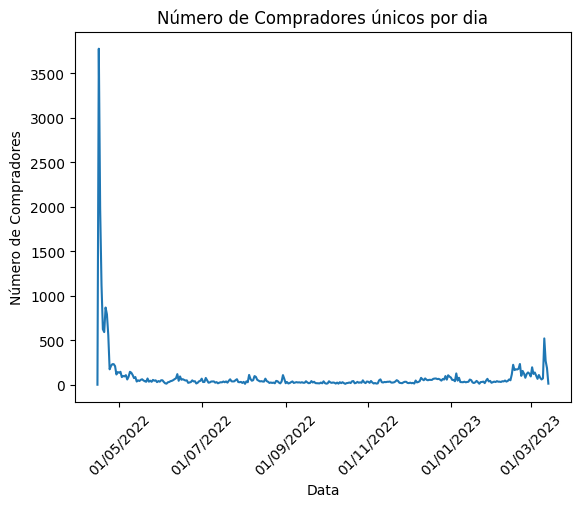

Arquivo 10


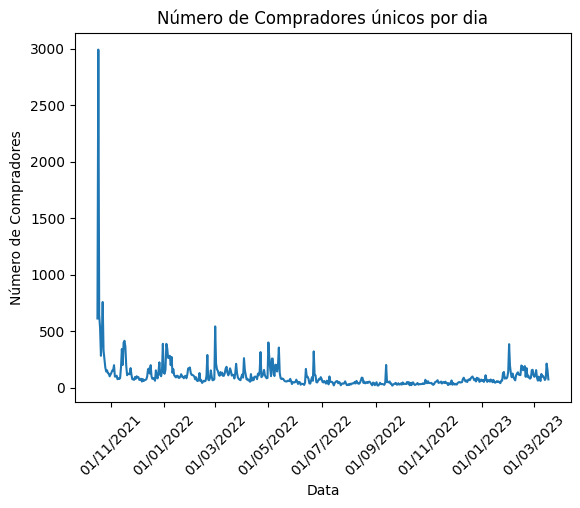

Arquivo 11


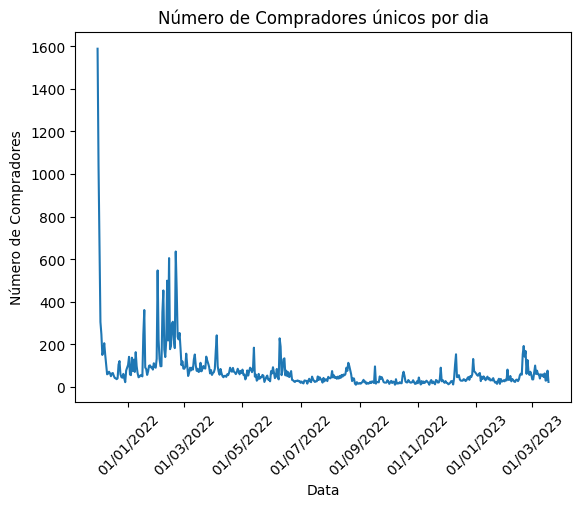

Arquivo 12


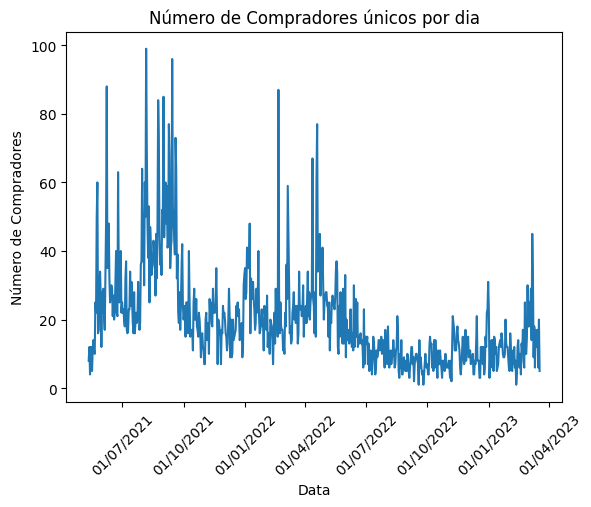

Arquivo 13


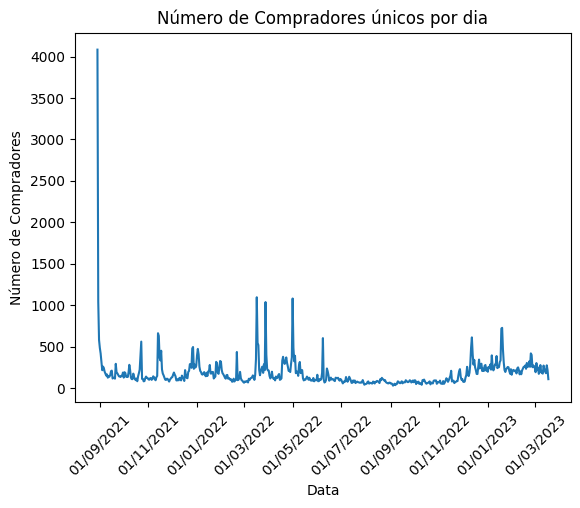

Arquivo 14


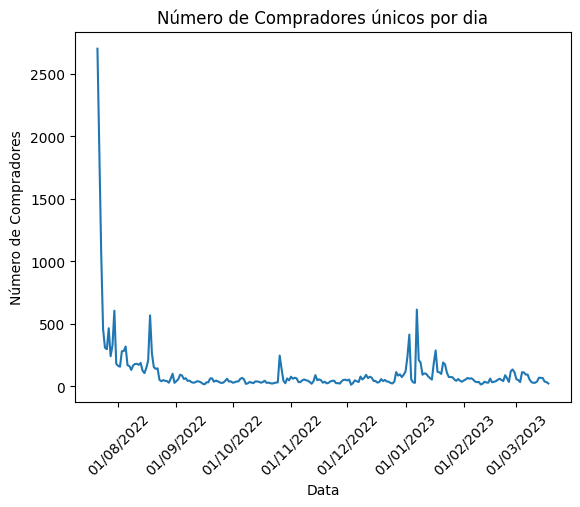

Arquivo 15


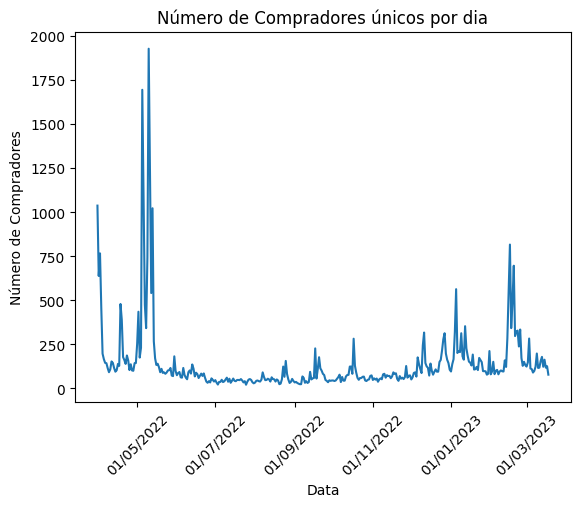

Arquivo 16


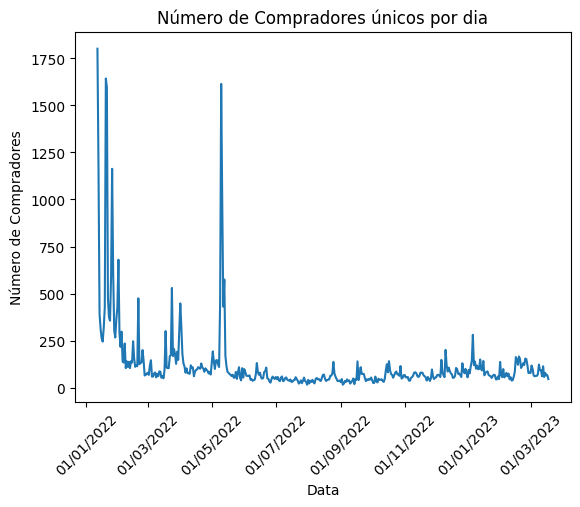

Arquivo 17


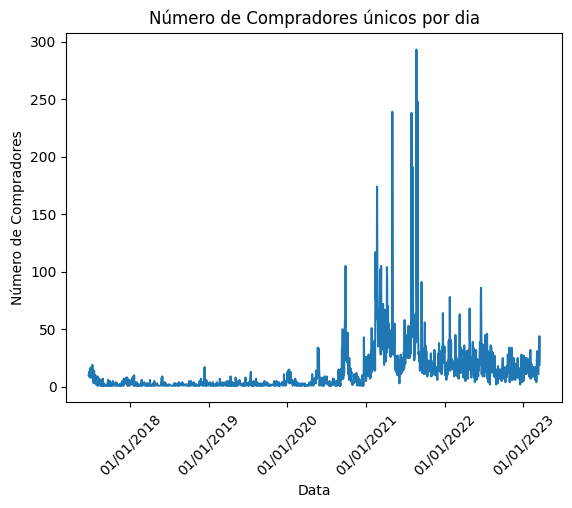

Arquivo 18


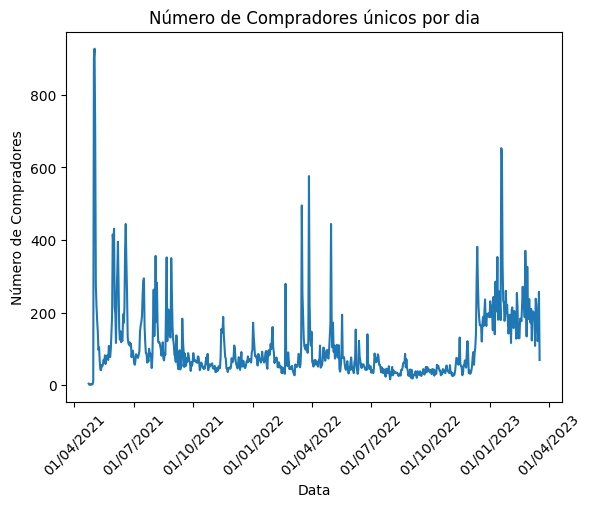

Arquivo 19


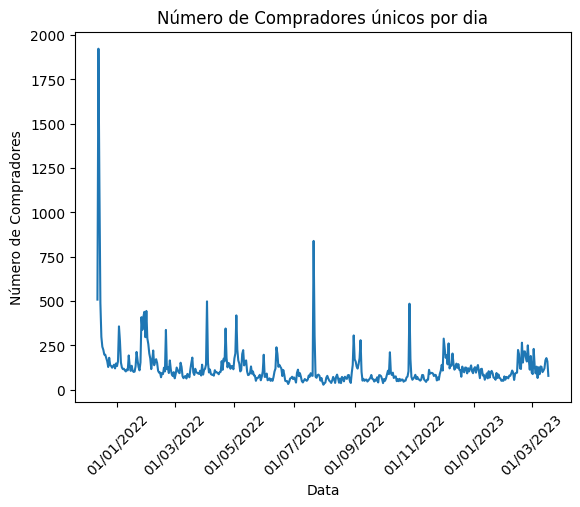

Arquivo 20


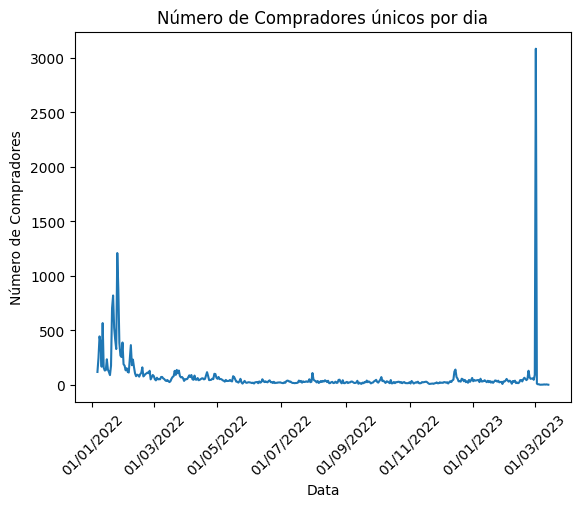

In [ ]:
for i in range(len(list_df_blue)):
    df = list_df_blue[i]

    # Agrupar os dados por data e TO_ADDRESS e contar o número de ocorrências únicas
    unique_users = df.groupby(['BLOCK_DATE', 'TO_ADDRESS'])['TO_ADDRESS'].nunique()

    # Plotar um gráfico de linhas com o número de usuários únicos por data
    unique_users.groupby('BLOCK_DATE').count().plot(kind='line')

    # Ajustar os rótulos do eixo X
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%Y'))
    plt.xticks(rotation=45)

    plt.title('Número de Compradores únicos por dia')
    plt.xlabel('Data')
    plt.ylabel('Número de Compradores')
    print("Arquivo " + str(i+1))
    plt.show()


In [ ]:
for i in range(len(list_df_blue)):
  print("\ndf" + str(i+1))
  df = list_df_blue[i]
  df.info()



df1
<class 'pandas.core.frame.DataFrame'>
Int64Index: 307667 entries, 0 to 407666
Data columns (total 13 columns):
 #   Column                   Non-Null Count   Dtype              
---  ------                   --------------   -----              
 0   ADDRESS_BLUE             307667 non-null  object             
 1   BLOCK_TIMESTAMP_BLUE     307667 non-null  object             
 2   BLOCK_TIMESTAMP          307667 non-null  datetime64[ns, UTC]
 3   FROM_ADDRESS             307667 non-null  object             
 4   TO_ADDRESS               307667 non-null  object             
 5   VALUE                    307667 non-null  int64              
 6   TRANSACTION_HASH         307667 non-null  object             
 7   NONCE                    307667 non-null  int64              
 8   FROM_ADDRESS_BLOCKCHAIN  307667 non-null  object             
 9   TO_ADDRESS_BLOCKCHAIN    307667 non-null  object             
 10  GAS                      307667 non-null  int64              
 11  RECEIPT_

In [ ]:
perc_buyer_seller = []
perc_seller_buyer = []

for i in range(len(list_df_blue)):
  df = list_df_blue[i]

  print('Conjunto de Dados ', str(i+1))

  num_unique_transactions = df['TRANSACTION_HASH'].nunique()
  print('Número de transações únicas:', num_unique_transactions)

  # Calcule a diferença entre as datas mínima e máxima em dias
  quantidade_dias = (df['BLOCK_DATE'].max() - df['BLOCK_DATE'].min()).days
  print('Quantidade de dias:', quantidade_dias)

  # Agrupar os dados por data e FROM_ADDRESS (Vendedores) e contar o número de ocorrências únicas
  unique_sellers= df.groupby(['BLOCK_DATE', 'FROM_ADDRESS'])['FROM_ADDRESS'].nunique()
  print('Número de vendedores únicos:', unique_sellers.count())

  # Agrupar os dados por data e TO_ADDRESS (Compradores) e contar o número de ocorrências únicas
  unique_buyers= df.groupby(['BLOCK_DATE', 'TO_ADDRESS'])['TO_ADDRESS'].nunique()
  print('Número de compradores únicos:', unique_buyers.count())

  # Proporção Compradores X Vendedores
  perc = (unique_buyers.count() / unique_sellers.count()) * 100
  perc_buyer_seller.append(perc)

  print('% de compradores X vendedores:', perc)

  # Proporção Vendedores X Compradores
  perc2 = (unique_sellers.count() / unique_buyers.count()) * 100
  perc_seller_buyer.append(perc2)

  print('% de vendedores X compradores:', perc2, "\n")

Conjunto de Dados  1
Número de transações únicas: 207295
Quantidade de dias: 318
Número de vendedores únicos: 133876
Número de compradores únicos: 121147
% de compradores X vendedores: 90.49194777256567
% de vendedores X compradores: 110.5070699233163 

Conjunto de Dados  2
Número de transações únicas: 57532
Quantidade de dias: 600
Número de vendedores únicos: 40291
Número de compradores únicos: 39339
% de compradores X vendedores: 97.63718944677471
% de vendedores X compradores: 102.4199903403747 

Conjunto de Dados  3
Número de transações únicas: 3954
Quantidade de dias: 134
Número de vendedores únicos: 2415
Número de compradores únicos: 1725
% de compradores X vendedores: 71.42857142857143
% de vendedores X compradores: 140.0 

Conjunto de Dados  4
Número de transações únicas: 4923
Quantidade de dias: 297
Número de vendedores únicos: 4214
Número de compradores únicos: 4023
% de compradores X vendedores: 95.46748932130991
% de vendedores X compradores: 104.74770072085508 

Conjunto d

In [ ]:
for i, objeto in enumerate(list_df_blue):
    nome_variavel = f"df{i+1}"
    locals()[nome_variavel] = objeto


In [ ]:
# see first lines
print('Lines: {}'.format(list_df_blue[0].shape[0]))
print('Columns: {}'.format(list_df_blue[0].shape[1]))
# df.reset_index()
list_df_blue[0].head()

Lines: 307667
Columns: 13


,ADDRESS_BLUE,BLOCK_TIMESTAMP_BLUE,BLOCK_TIMESTAMP,FROM_ADDRESS,TO_ADDRESS,VALUE,TRANSACTION_HASH,NONCE,FROM_ADDRESS_BLOCKCHAIN,TO_ADDRESS_BLOCKCHAIN,GAS,RECEIPT_GAS_USED,BLOCK_DATE
0,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,2022-04-28 12:49:10 UTC,2022-09-21 00:26:11+00:00,0xa5e45f443981fba491406d44131d13069316adf8,0x8a0473179492147c785be2dd0b65f320aa4650ec,63031,0x04068a38fda3113a1073a9dbefa3acb1158880b8e870...,665,0x8a0473179492147c785be2dd0b65f320aa4650ec,0x2b2e8cda09bba9660dca5cb6233787738ad68329,171194,130662,2022-09-21
1,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,2022-04-28 12:49:10 UTC,2022-09-21 23:08:11+00:00,0x36c72892fcc72b52fa3b82ed3bb2a467d9079b9a,0x5fc6c0f8e928e44efb90841a2f4994a299072c4b,92488,0xafe35dea782e4c67d062d266bc88a54cc4059e13c38e...,26449,0xf408bee3443d0397e2c1cde588fb060ac657006f,0x36c72892fcc72b52fa3b82ed3bb2a467d9079b9a,400000,263036,2022-09-21
2,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,2022-04-28 12:49:10 UTC,2022-09-21 23:08:11+00:00,0xdaf517e6079e856456273fff699286848f78d580,0x36c72892fcc72b52fa3b82ed3bb2a467d9079b9a,92488,0xafe35dea782e4c67d062d266bc88a54cc4059e13c38e...,26449,0xf408bee3443d0397e2c1cde588fb060ac657006f,0x36c72892fcc72b52fa3b82ed3bb2a467d9079b9a,400000,263036,2022-09-21
3,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,2022-04-28 12:49:10 UTC,2022-06-02 00:45:36+00:00,0x1bba210bf64afe134712aad2aaa26d118c56e027,0xd511b23b069b9c5b302a27ed2efa27d47ef3557c,62020,0x4ed6f1791c2dfea947fea4ac13c5a1e276c9ed658b90...,70,0x1bba210bf64afe134712aad2aaa26d118c56e027,0x2812e5ce632c70e018dcff97bbca215329b01665,303593,244193,2022-06-02
4,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,2022-04-28 12:49:10 UTC,2022-06-02 07:20:15+00:00,0x32d53d5a2e6a2b3172d413c47b0d3093e39186fd,0x71855901c070e9f36712b210b08f0492e092a416,95179,0x2e149e7988277c48b392c5e813a3ebdef5a02945a7b8...,433,0x32d53d5a2e6a2b3172d413c47b0d3093e39186fd,0x8a6da43d246910e21b86a340e98cb561e1d51a1f,534168,455692,2022-06-02


In [ ]:
print(list_df_blue[0]['FROM_ADDRESS'].value_counts())

0x39da41747a83aee658334415666f3ef92dd0d541    9765
0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2    5680
0x020ca66c30bec2c4fe3861a94e4db4a498a35872    3068
0xd5ee00b7babd9374d32159cd7cd82bb99ef831fd    2990
0x8ae57a027c63fca8070d1bf38622321de8004c67    1632
                                              ... 
0x43817a1c41a869882663e88819ce91eb33f171c3       1
0x8ee0e63ea2ec90bb464854086e74cc1e508024ba       1
0x934e0a14349ab5f060fa8c5734111d9125e0fe6a       1
0x8c197db132a18cf2c0b46a1051d7c3e43f65a17b       1
0x88668b63218bcfd31692e14f635d195f9f45c030       1
Name: FROM_ADDRESS, Length: 70074, dtype: int64


Histograma representando a quantidade de transações ao longo das datas do dataframe

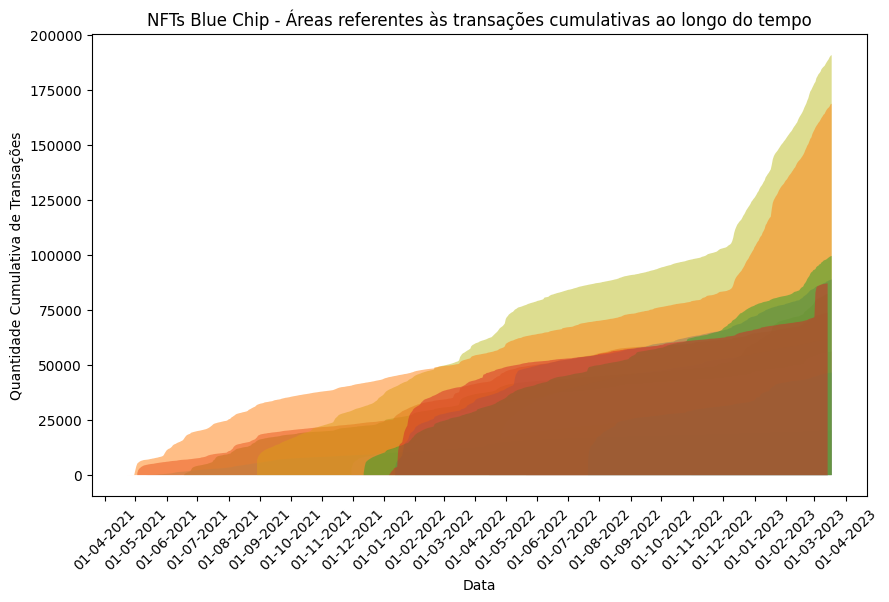

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 15, 17, 18, 19]

# Criar uma figura
fig, ax = plt.subplots(figsize=(10, 6))

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_blue[i]

    # Agrupar os dados por data e contar o número de transações
    transactions_count = df.groupby('BLOCK_DATE').size().cumsum()

    # Plotar um gráfico de área com a quantidade cumulativa de transações por data
    plt.fill_between(transactions_count.index, transactions_count, label=f'NFT Blue {i}', alpha=0.5)

# Configurar os rótulos do eixo x para exibir dia, mês e ano
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.22, 1.01))

# Girar os rótulos do eixo X em 45 graus
plt.xticks(rotation=45)

# Desativar o grid
plt.grid(False)

# Definir os rótulos do eixo x e y
plt.xlabel('Data')
plt.ylabel('Quantidade Cumulativa de Transações')

# Adicionar título
plt.title('NFTs Blue Chip - Áreas referentes às transações cumulativas ao longo do tempo')

# Exibir o gráfico
plt.show()


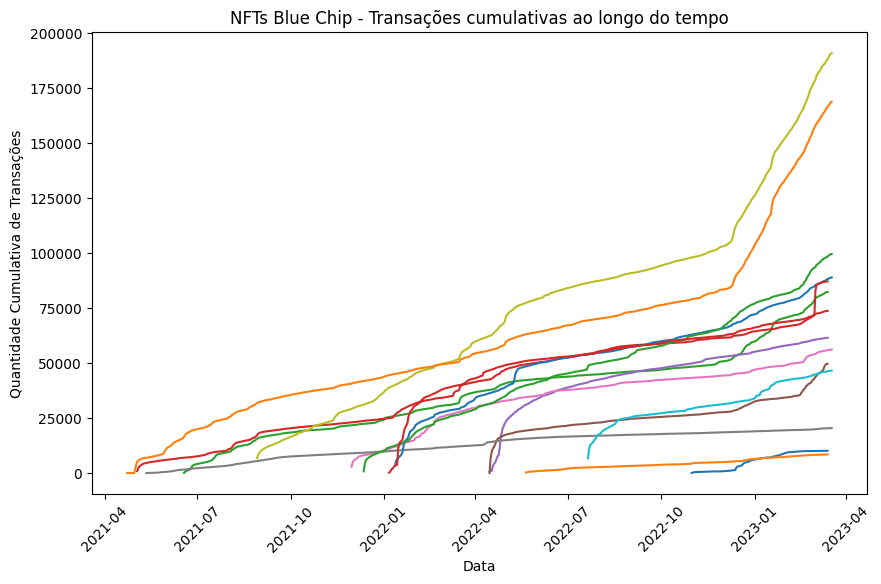

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Índices dos dataframes desejados
indices_selecionados = [2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 15, 17, 18, 19]

# Criar uma figura
fig, ax = plt.subplots(figsize=(10, 6))

# Para cada índice na lista de índices selecionados
for i in indices_selecionados:
    df = list_df_blue[i]

    # Agrupar os dados por data e contar o número de transações
    transactions_count = df.groupby('BLOCK_DATE').size().cumsum()

    # Plotar um gráfico de linha com a quantidade cumulativa de transações por data
    plt.plot(transactions_count.index, transactions_count, label=f'NFT Blue Chip {i}')

# Adicionar legenda na parte superior à direita, fora do frame
# plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1.01))

# Girar os rótulos do eixo X em 45 graus
plt.xticks(rotation=45)

# Desativar o grid
plt.grid(False)

# Definir os rótulos do eixo x e y
plt.xlabel('Data')
plt.ylabel('Quantidade Cumulativa de Transações')

# Adicionar título
plt.title('NFTs Blue Chip - Transações cumulativas ao longo do tempo')

# Exibir o gráfico
plt.show()


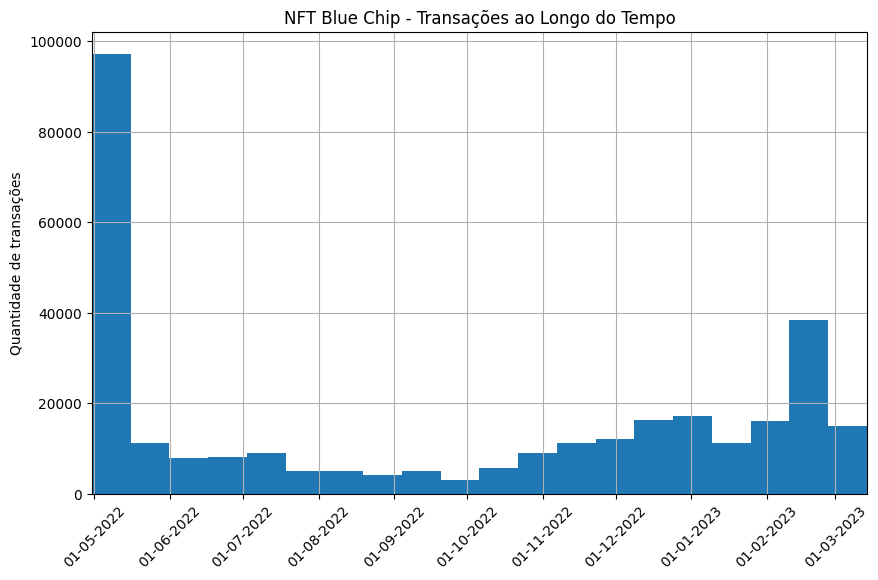

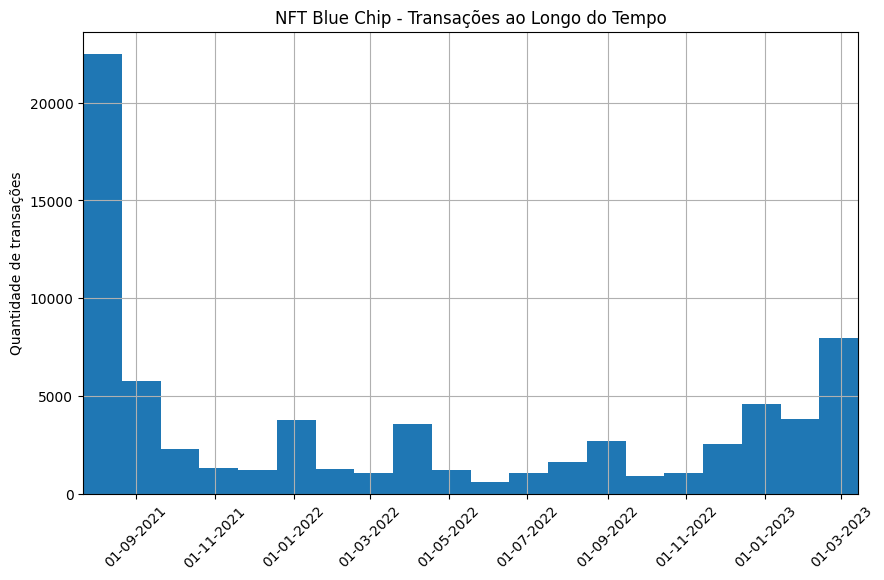

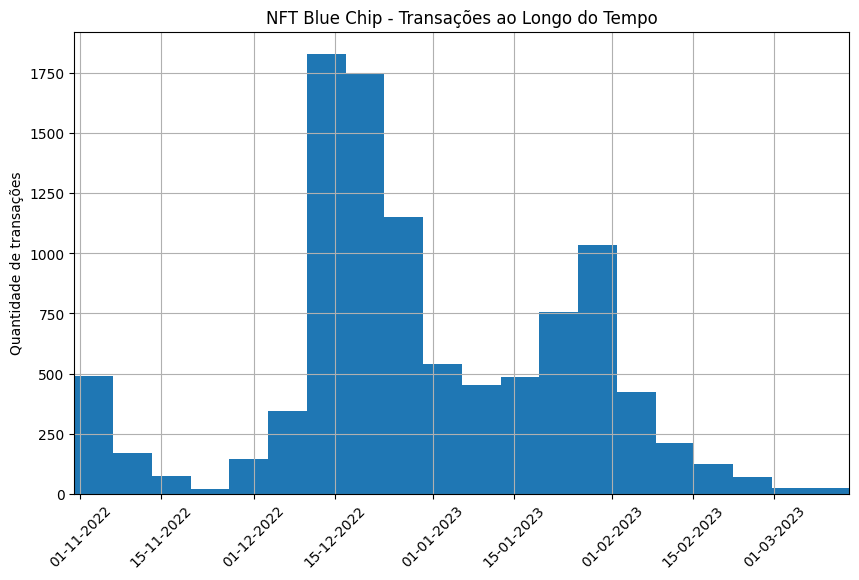

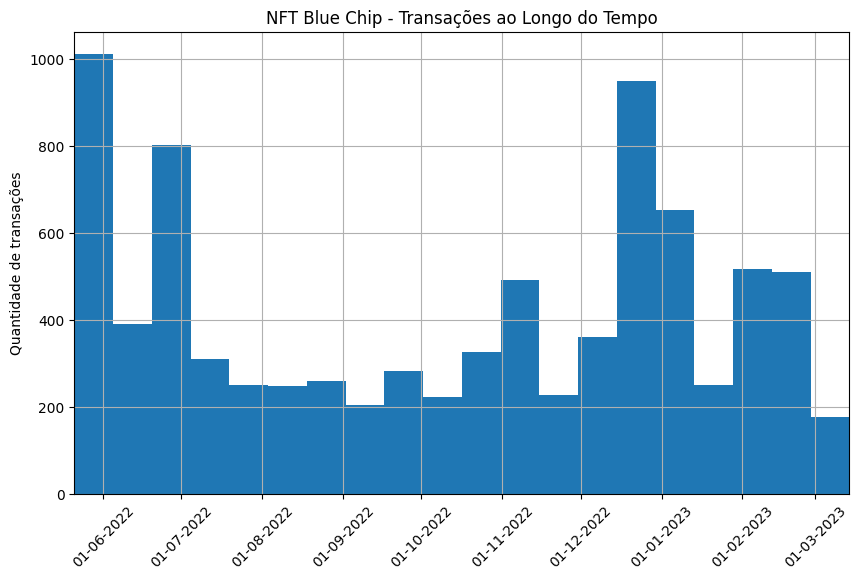

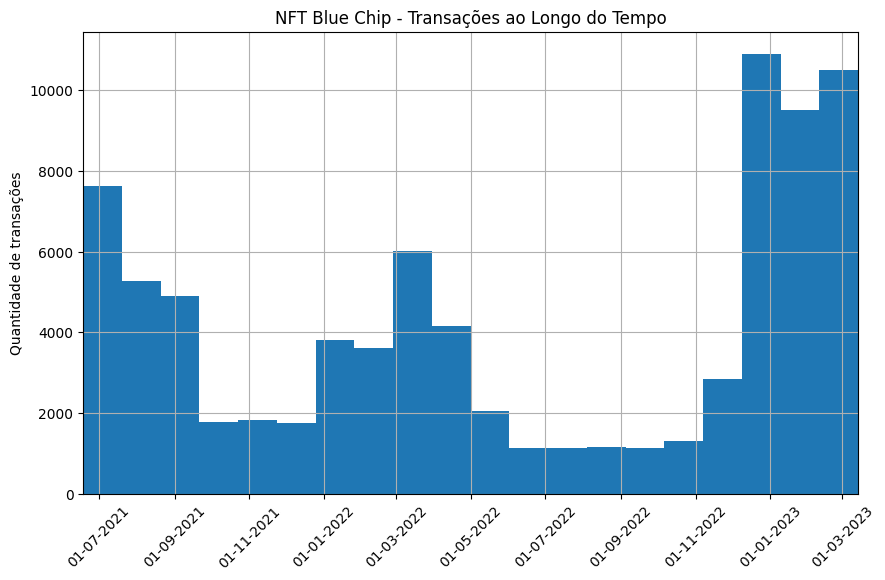

...

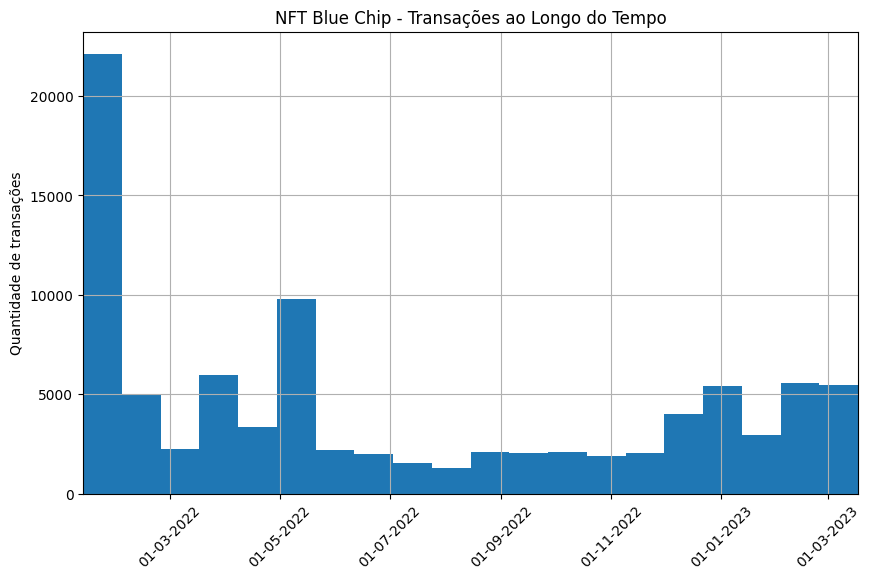

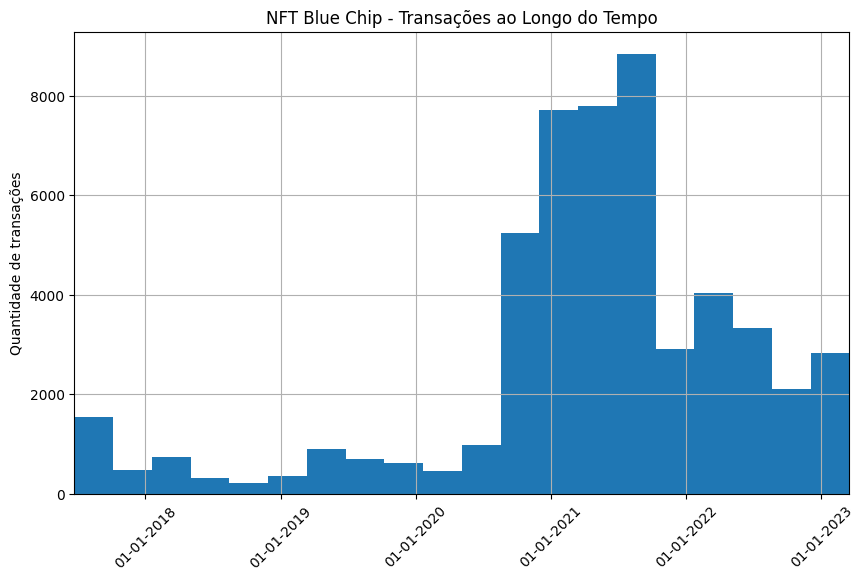

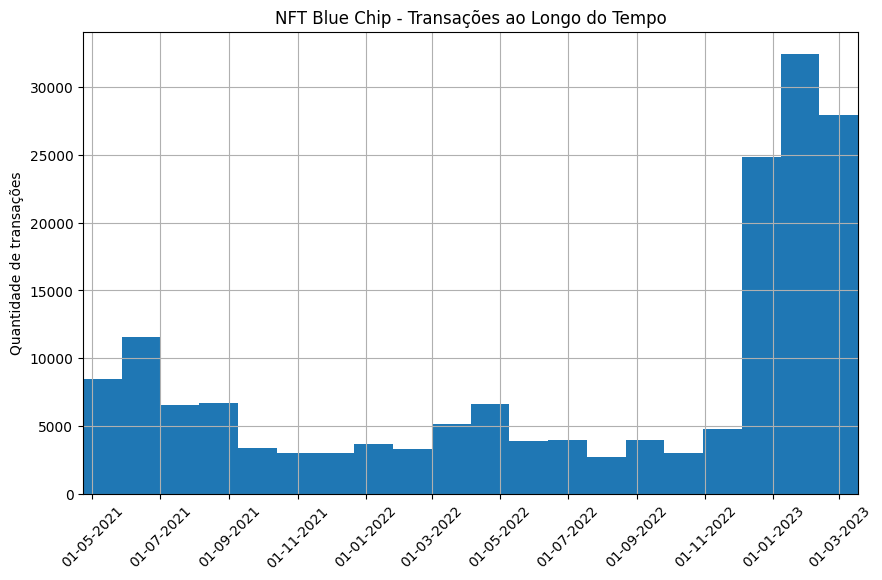

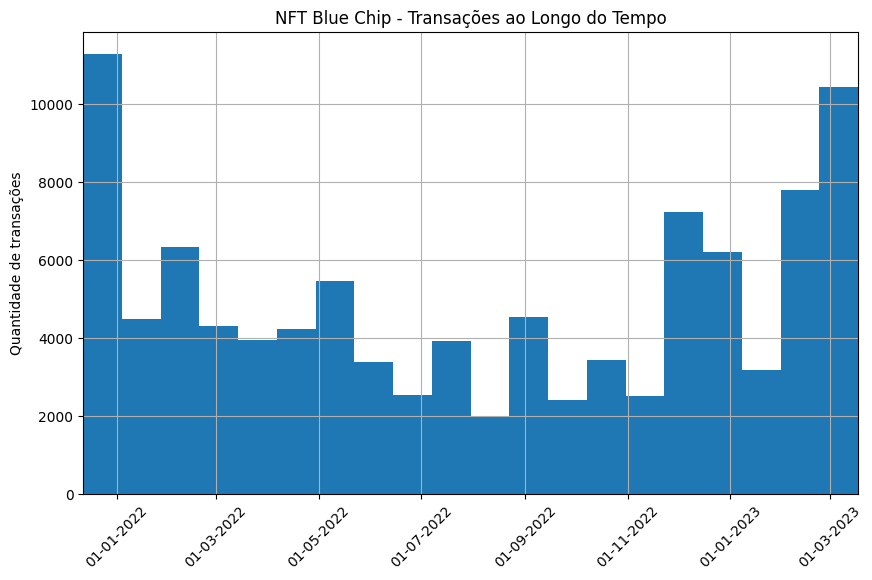

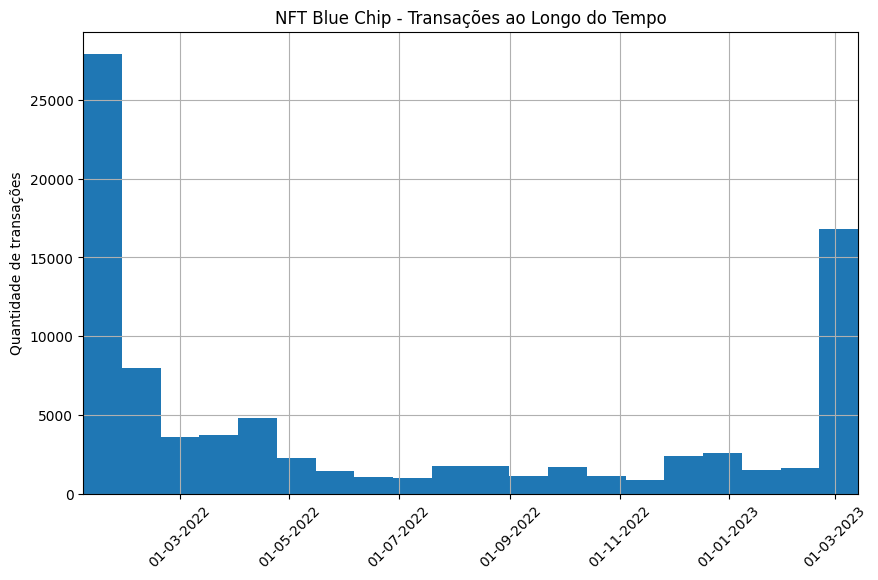

In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):

  # Definindo o tamanho da figura
  plt.figure(figsize=(10, 6))

  # Criando o histograma
  list_df_blue[i]['BLOCK_DATE'].hist(bins=20)

  # Definindo os rótulos do eixo x e y
  # plt.xlabel('Data')
  plt.ylabel('Quantidade de transações')

  # Girando os rótulos do eixo X em 45 graus
  plt.xticks(rotation=45)

  # Ajustando a formatação das datas no eixo X
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))

  # Definindo os limites do eixo X
  plt.xlim(list_df_blue[i]['BLOCK_DATE'].min(), list_df_blue[i]['BLOCK_DATE'].max())

# Adicionar título
  plt.title('NFT Blue Chip - Transações ao Longo do Tempo')

  # Exibindo o gráfico
  plt.show()

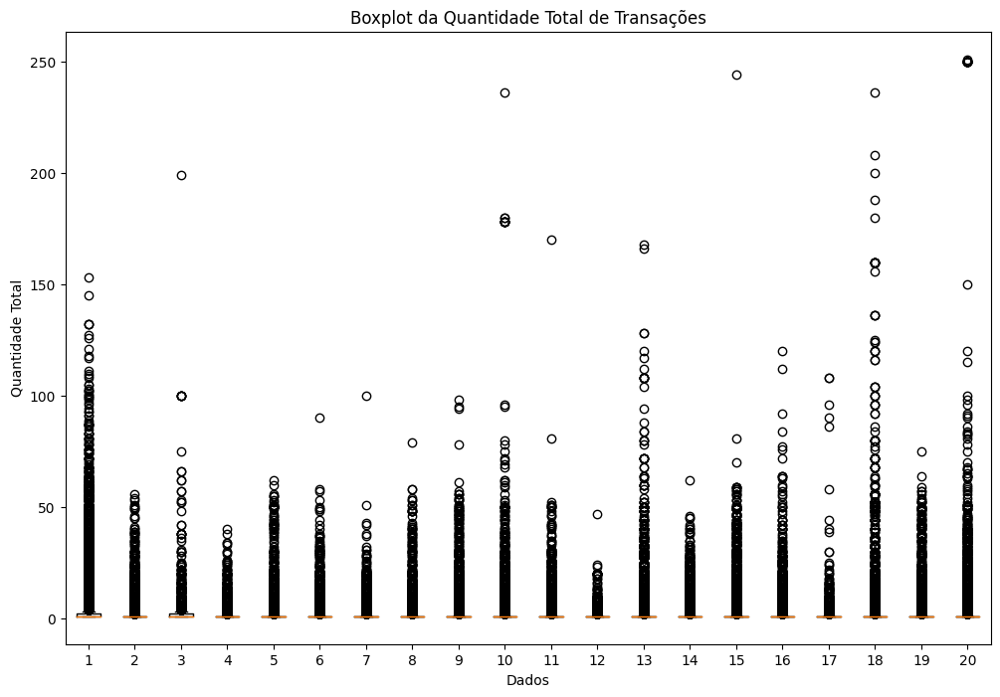

In [ ]:
# Criar um dicionário de rótulos
# labels_dict = {i: 'Transações Dataframe ' + str(i) for i in range(len(list_df_comum))}

# Criar uma lista vazia para armazenar os dados do boxplot
data = []

# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):
    # Criar uma lista com os valores da quantidade total de transações
    total_transactions = list_df_blue[i].groupby('BLOCK_TIMESTAMP').size().values.tolist()

    # Adicionar os valores ao conjunto de dados
    data.append(total_transactions)


# Definir o tamanho da figura
plt.figure(figsize=(12, 8))

# Criar o gráfico boxplot com rótulos personalizados no eixo x
# plt.boxplot(data, labels=[labels_dict[i] for i in range(len(list_df_comum))])
plt.boxplot(data)

# Adicionar título e rótulo dos eixos
plt.title('Boxplot da Quantidade Total de Transações')
plt.xlabel('Dados')
plt.ylabel('Quantidade Total')

# Exibir o gráfico
plt.show()

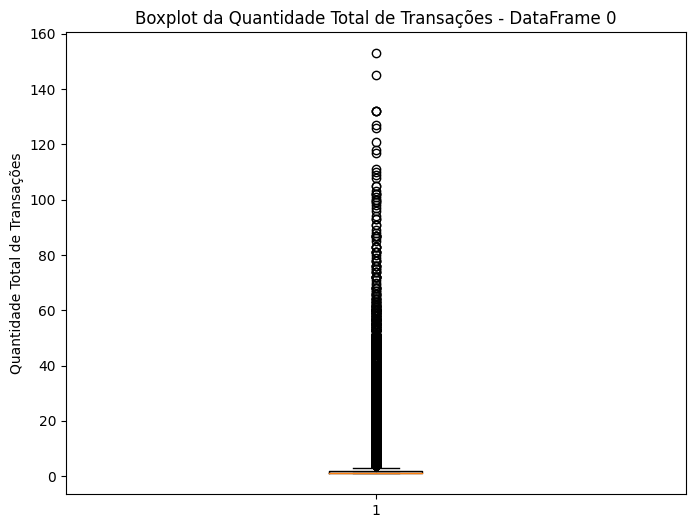

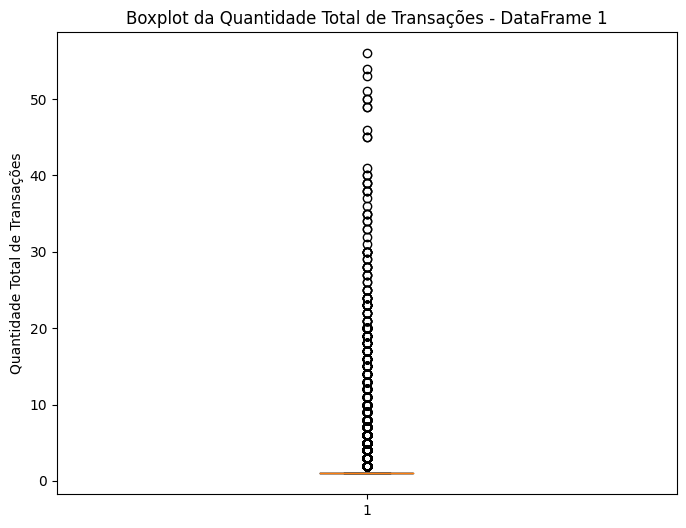

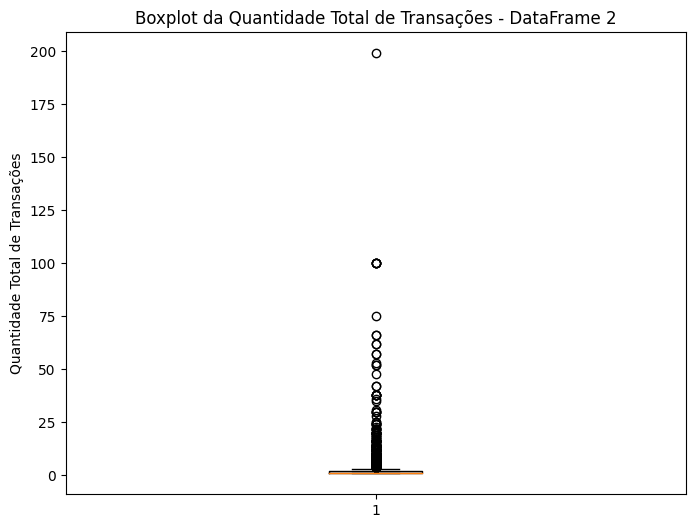

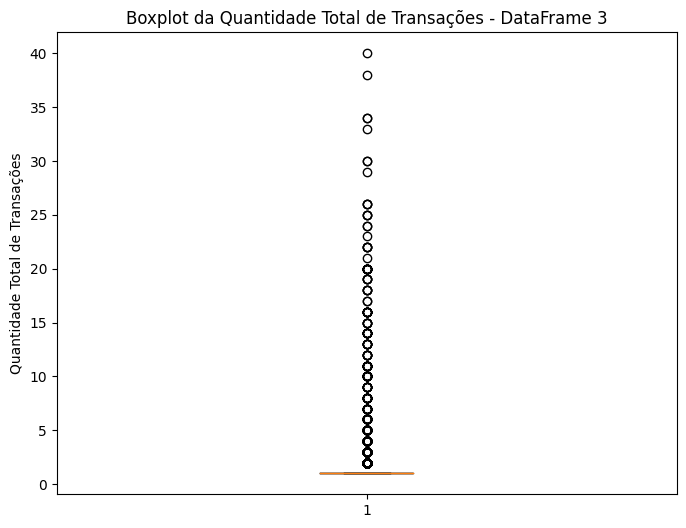

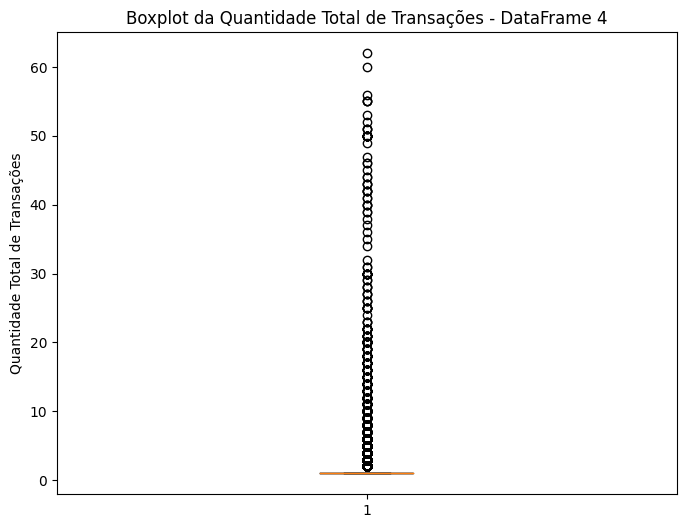

...

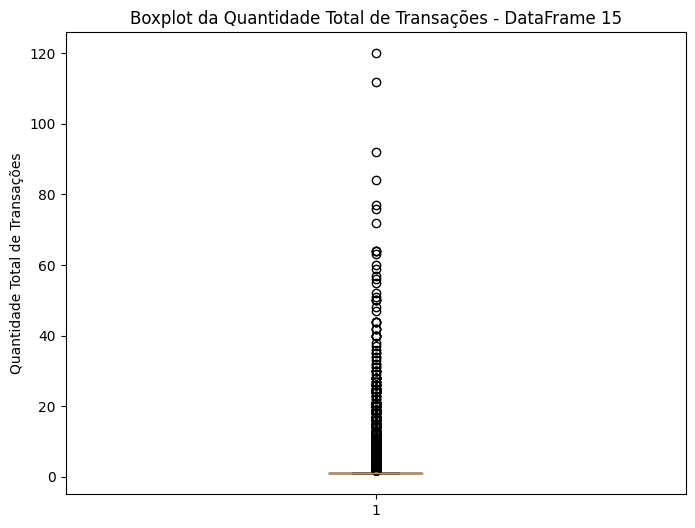

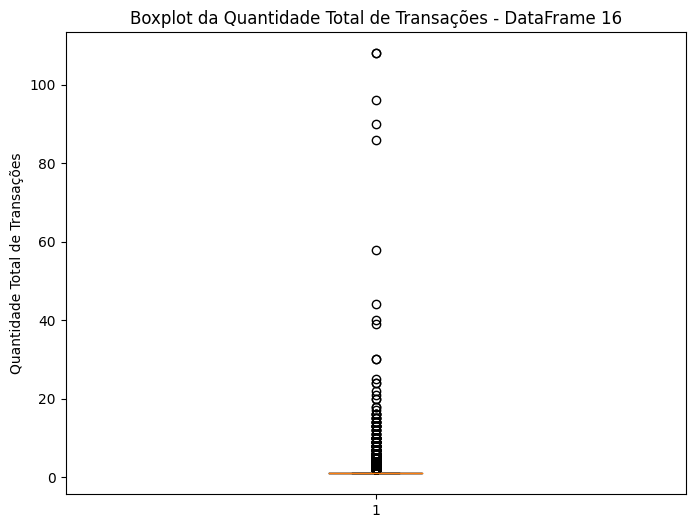

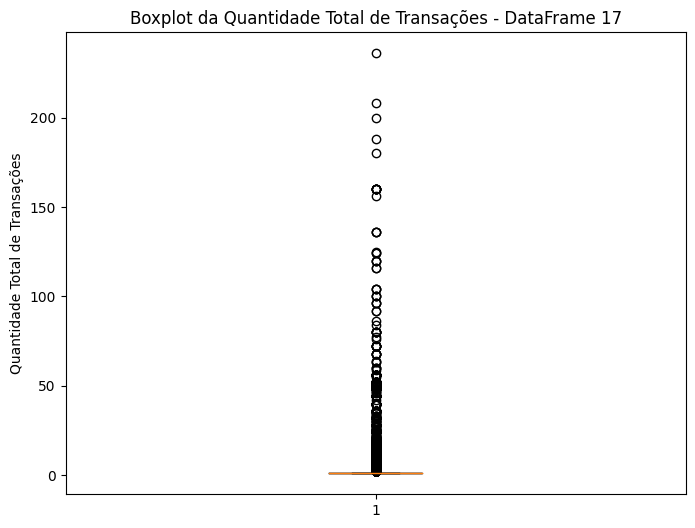

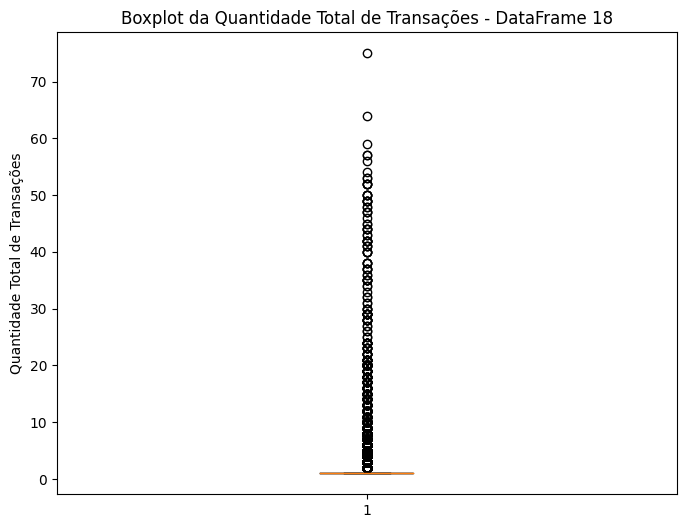

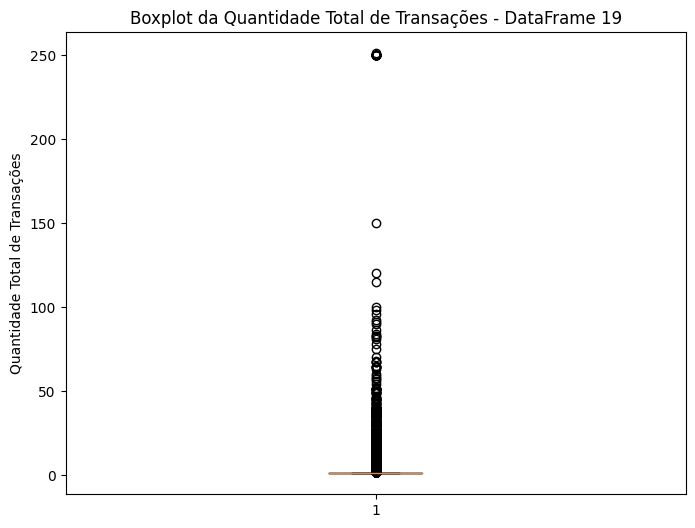

In [ ]:
for i in range(len(list_df_blue)):
    # Criar uma lista com os valores da quantidade total de transações
    total_transactions = list_df_blue[i].groupby('BLOCK_TIMESTAMP').size().values.tolist()

    # Criar o gráfico boxplot com o Matplotlib
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.boxplot(total_transactions)

    # Adicionar título e rótulo dos eixos
    ax.set_title('Boxplot da Quantidade Total de Transações - DataFrame ' + str(i))
#   ax.set_xlabel('DataFrame ' + str(i))
    ax.set_ylabel('Quantidade Total de Transações')

    # Exibir o gráfico
    plt.show()

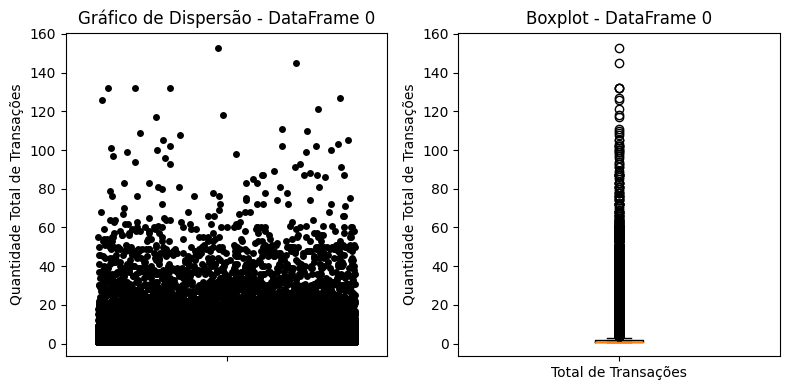

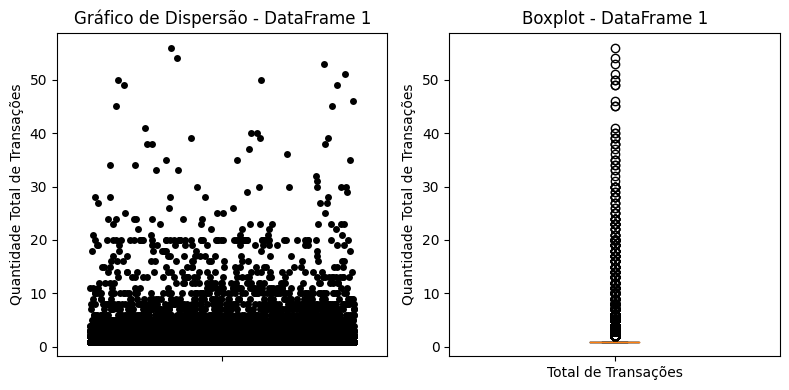

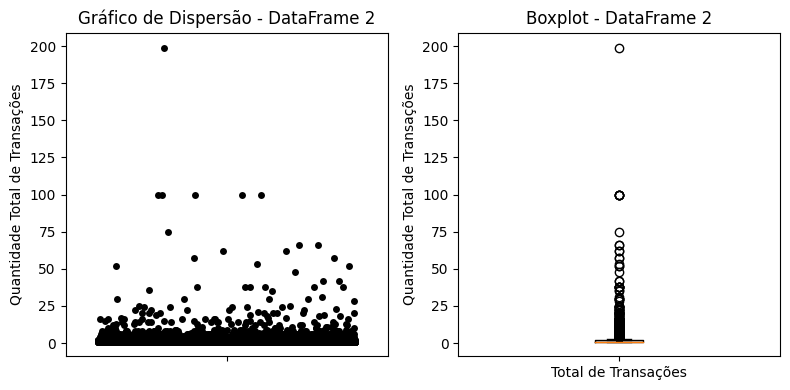

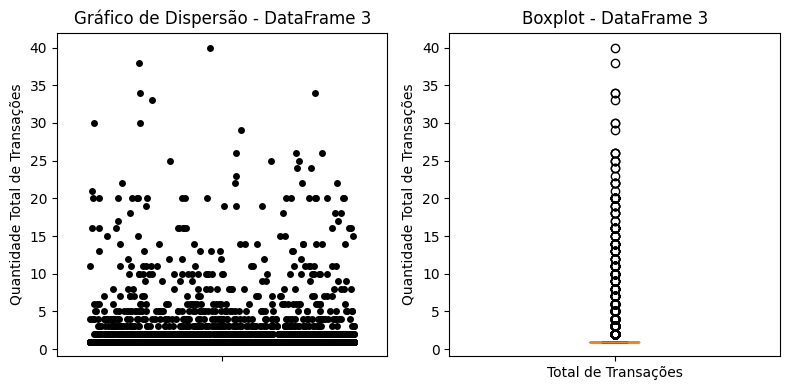

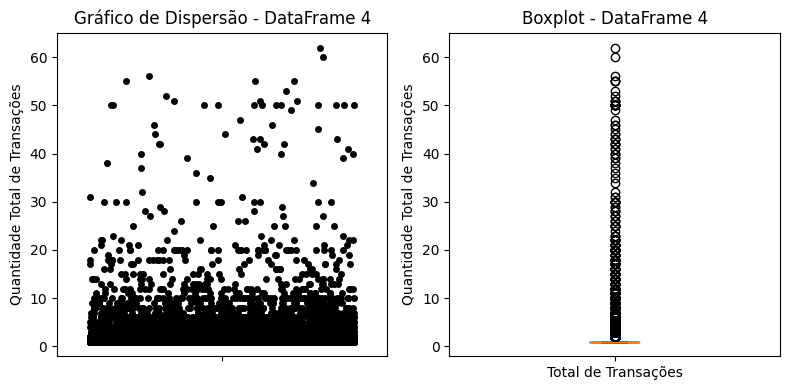

...

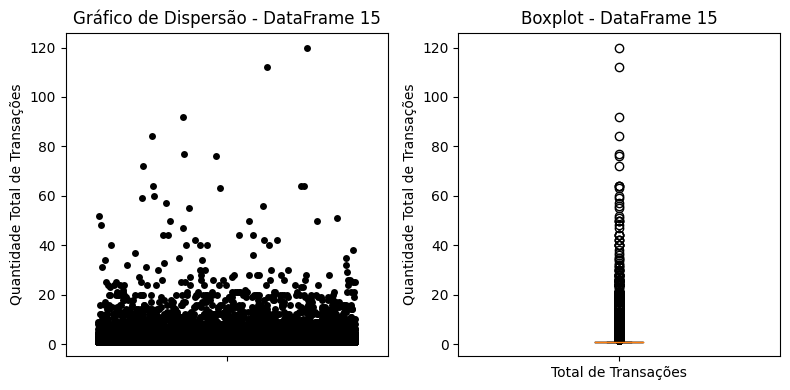

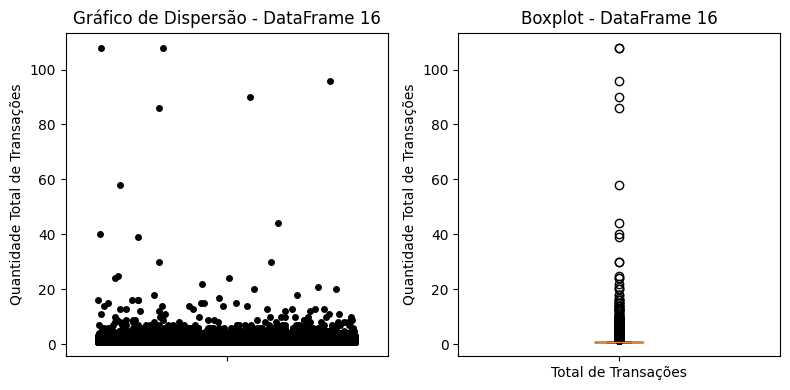

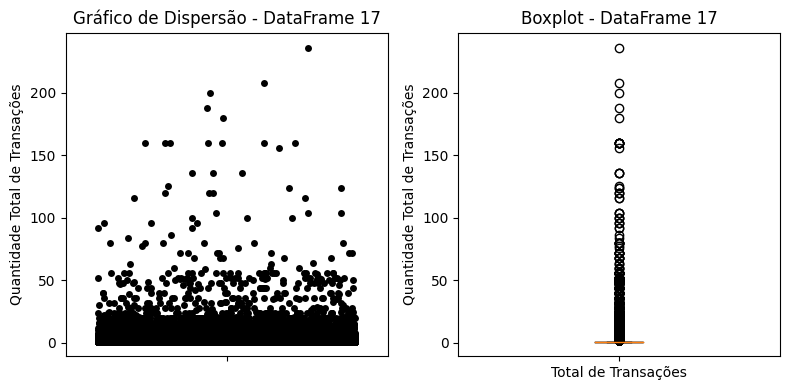

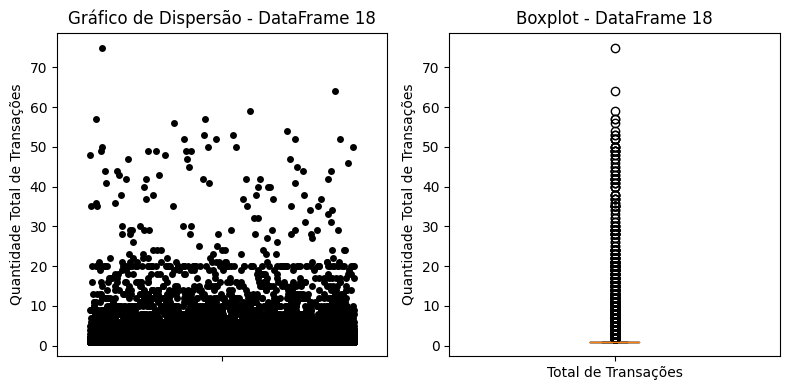

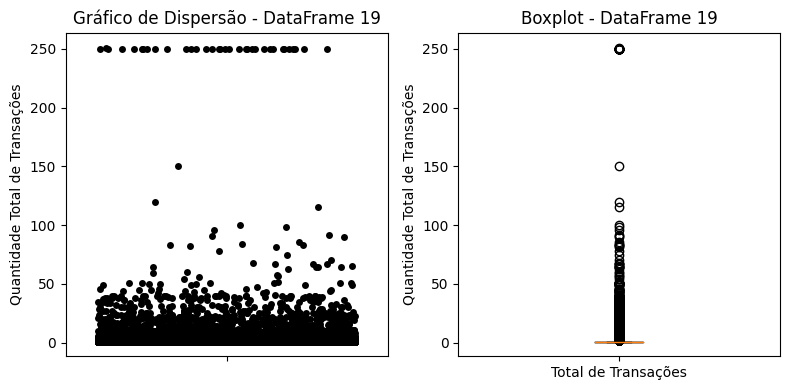

In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):
    # Criar uma lista com os valores da quantidade total de transações
    total_transactions = list_df_blue[i].groupby('BLOCK_TIMESTAMP').size().values.tolist()

    # Criar os subplots
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4))

    # Plotar o gráfico de dispersão no primeiro subplot
    sns.stripplot(y=total_transactions, jitter=0.4, color='black', ax=axs[0])
    axs[0].set_ylabel('Quantidade Total de Transações')

    # Plotar o boxplot no segundo subplot
    axs[1].boxplot(total_transactions)
    axs[1].set_ylabel('Quantidade Total de Transações')
    axs[1].set_xticklabels(['Total de Transações'])

    # Definir o título para cada um dos subplots
    axs[0].set_title('Gráfico de Dispersão - DataFrame ' + str(i))
    axs[1].set_title('Boxplot - DataFrame ' + str(i))

    # Ajustar espaçamento entre subplots
    plt.tight_layout()

    # Exibir a figura completa
    plt.show()

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


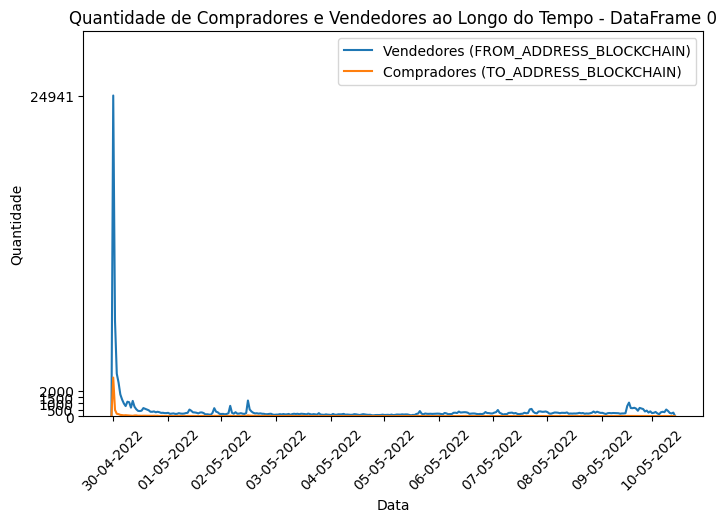

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


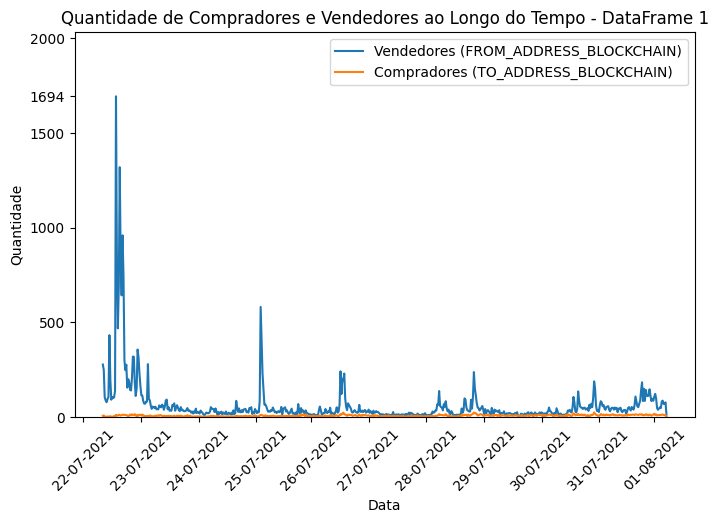

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


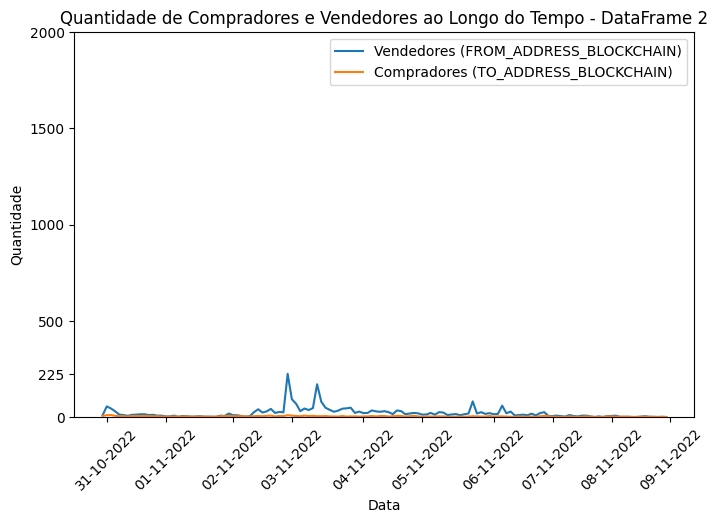

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


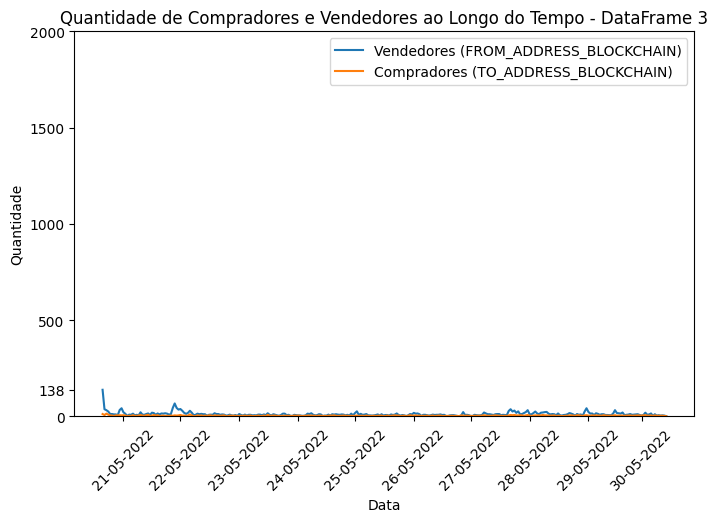

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


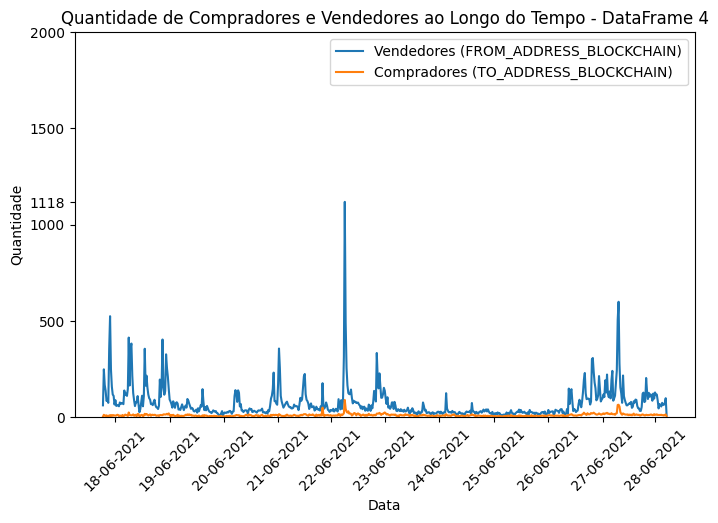

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


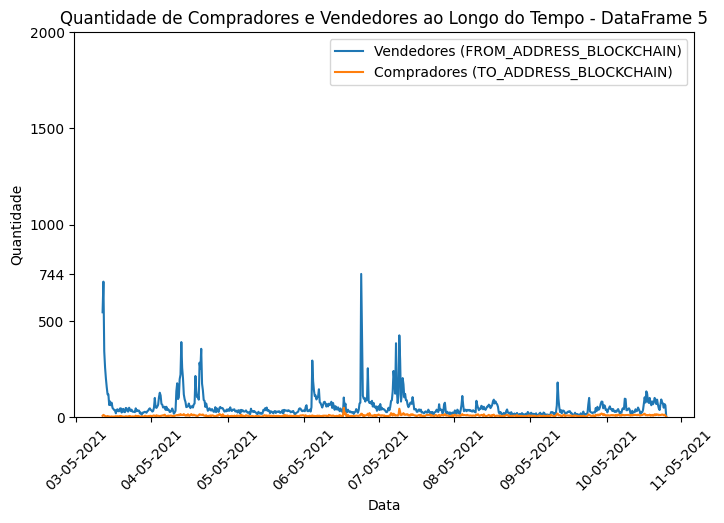

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


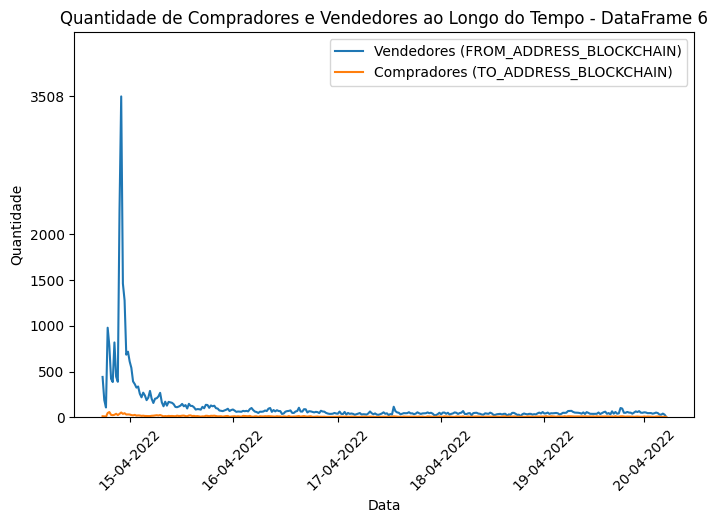

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


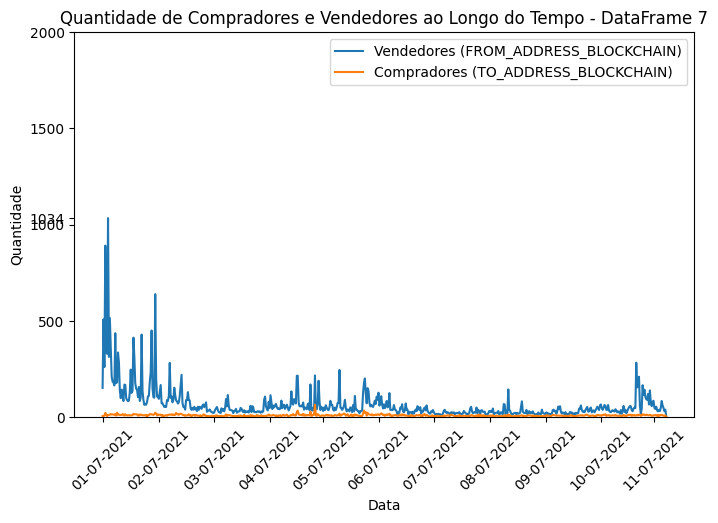

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


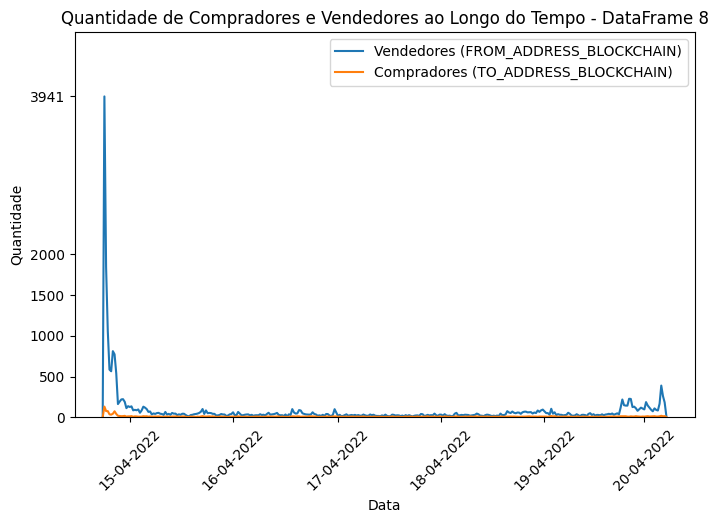

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


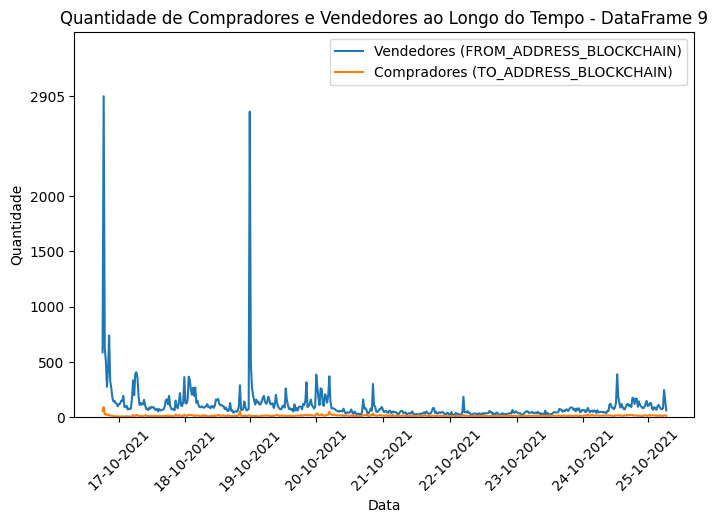

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


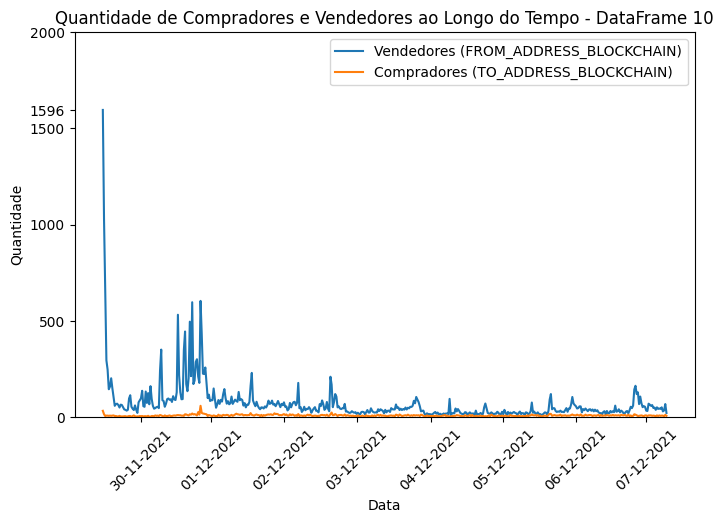

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


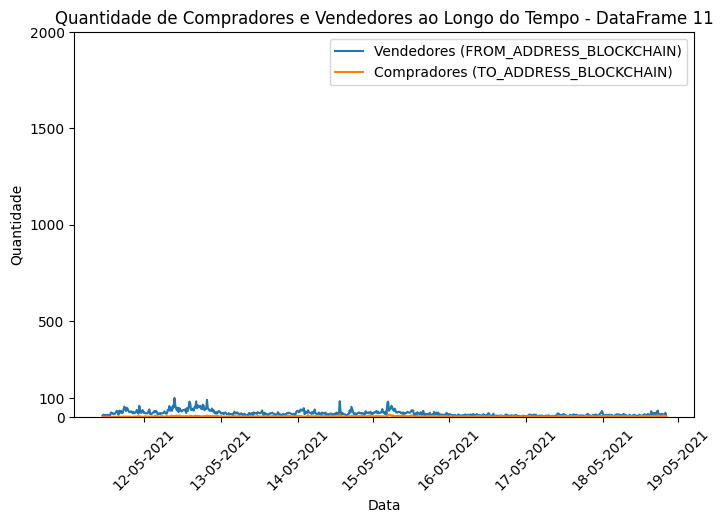

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


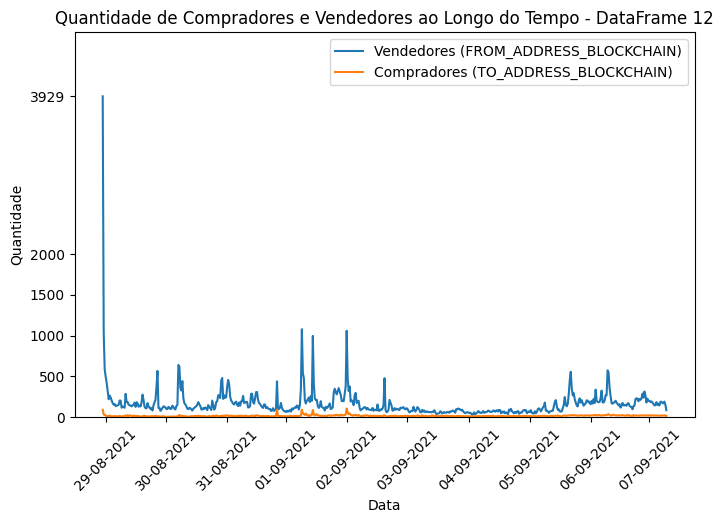

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


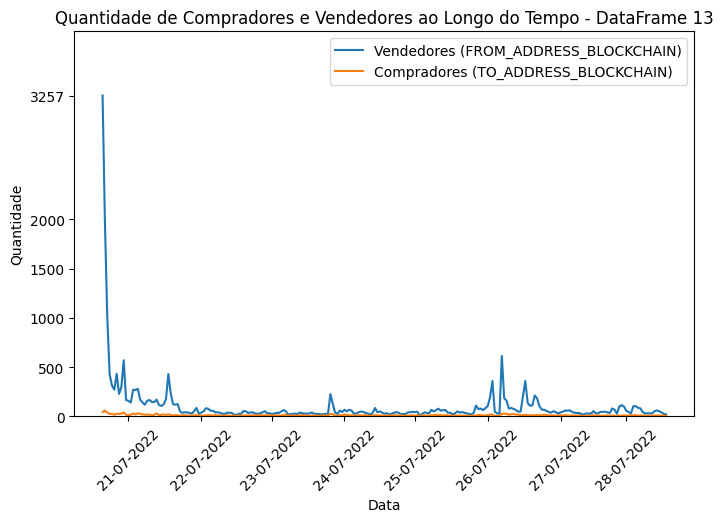

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


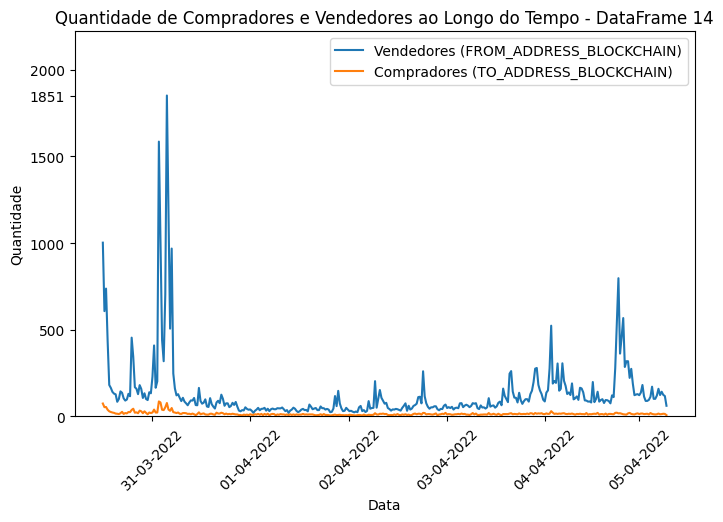

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


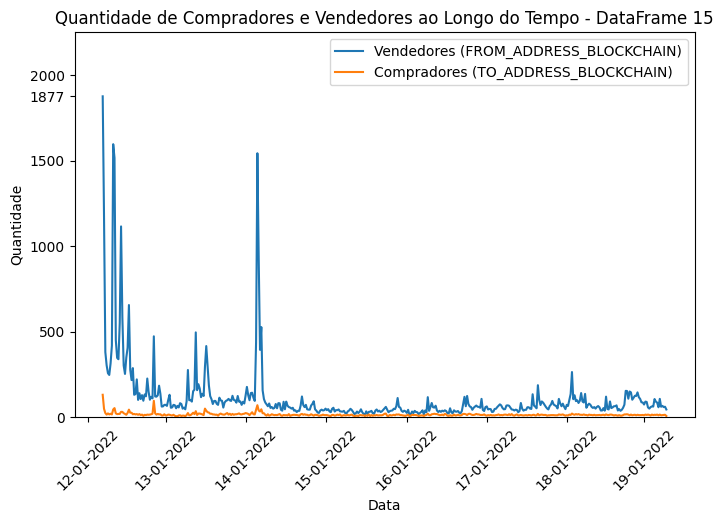

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


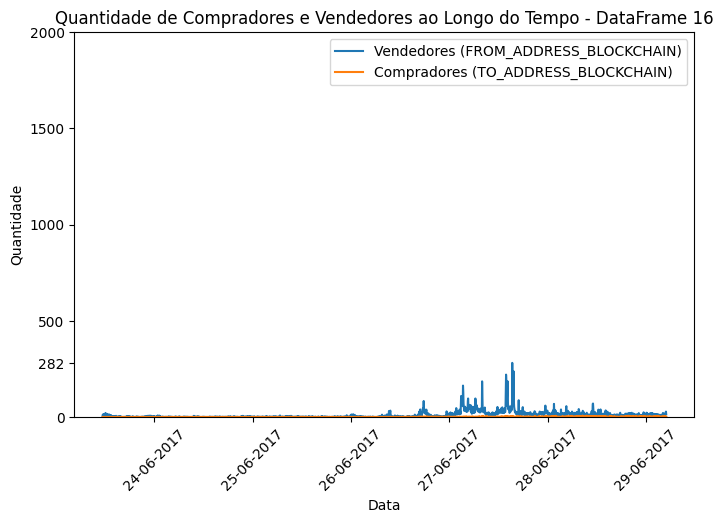

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


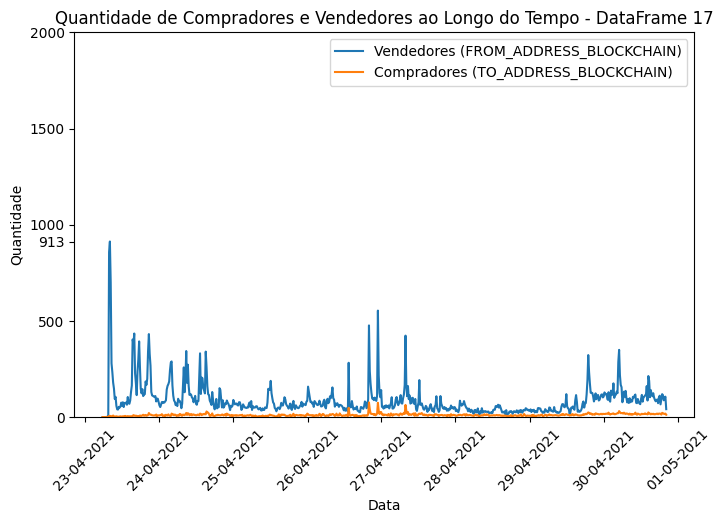

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


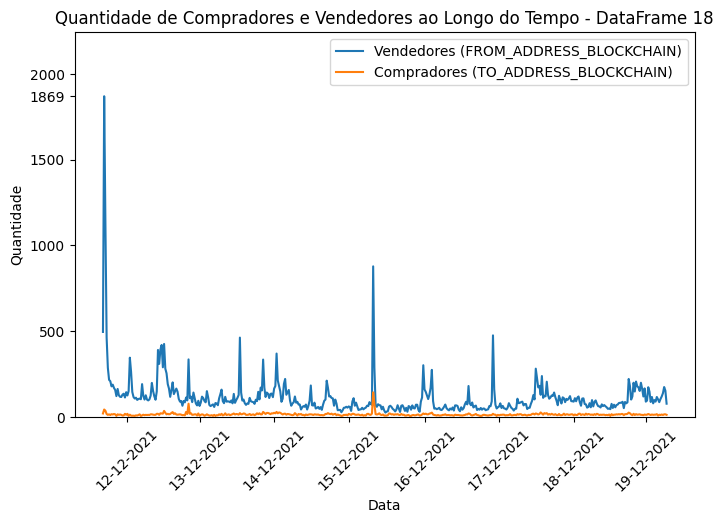

<ipython-input-33-8eaf25083ac2>:36: UserWarning: FixedFormatter should only be used together with FixedLocator


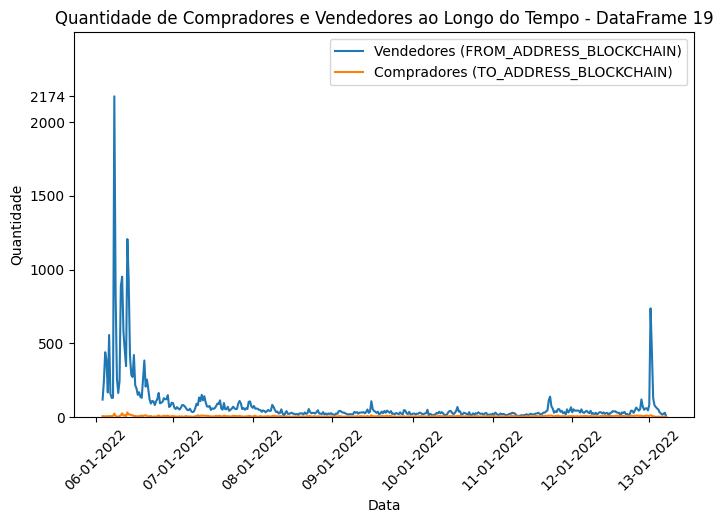

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):
    # Criar uma lista com os valores da quantidade total de transações
    # Calculando a contagem diária de compradores únicos
    df_daily_count_from = list_df_blue[i].groupby('BLOCK_DATE')['FROM_ADDRESS_BLOCKCHAIN'].nunique()
    df_daily_count_to = list_df_blue[i].groupby('BLOCK_DATE')['TO_ADDRESS_BLOCKCHAIN'].nunique()

    # Converter o índice em um objeto DatetimeIndex
    df_daily_count_from.index = pd.to_datetime(df_daily_count_from.index)
    df_daily_count_to.index = pd.to_datetime(df_daily_count_to.index)

    # Definindo o tamanho da figura
    plt.figure(figsize=(8, 5))

    # Plotando os pontos
    # plt.scatter(df_daily_count_from.index, df_daily_count_from, s=10, label='Vendedores (FROM_ADDRESS_BLOCKCHAIN)')
    # plt.scatter(df_daily_count_to.index, df_daily_count_to, s=10, label='Compradores (TO_ADDRESS_BLOCKCHAIN)')

    # Plotando as séries temporais de vendedores únicos
    plt.plot(df_daily_count_from.index, df_daily_count_from, label='Vendedores (FROM_ADDRESS_BLOCKCHAIN)')
    plt.plot(df_daily_count_to.index, df_daily_count_to, label='Compradores (TO_ADDRESS_BLOCKCHAIN)')

    plt.title('Quantidade de Compradores e Vendedores ao Longo do Tempo - DataFrame ' + str(i))

    # Girando os rótulos do eixo X em 45 graus
    plt.xticks(rotation=45)

    # Definindo os rótulos do eixo x e y
    plt.xlabel('Data')
    plt.ylabel('Quantidade')

    # Formatar as datas no eixo x
    plt.gca().xaxis.set_major_formatter(plt.FixedFormatter(df_daily_count_from.index.strftime('%d-%m-%Y')))

    # Definindo os rótulos do eixo y
    plt.ylim(0, max(max(df_daily_count_from), max(df_daily_count_to))*1.2)
    plt.yticks([0, 500, 1000, 1500, 2000, max(max(df_daily_count_from), max(df_daily_count_to))])

    # Adicionando uma legenda
    plt.legend()

    # Exibindo o gráfico
    plt.show()

Gráfico de boxplot. Ele define o tamanho da figura do gráfico, gera o boxplot utilizando a função sns.boxplot(), define os rótulos dos eixos x e y e a escala do eixo y, e exibe o gráfico final. Em resumo, esse código produz um gráfico que mostra a distribuição dos valores da série temporal em quartis (25%, 50% e 75%), permitindo a identificação de outliers, bem como a comparação da dispersão dos dados em diferentes períodos de tempo. Neste caso, o boxplot é utilizado para visualizar a distribuição do número de vendedores únicos em cada dia, com a escala do eixo y limitada a 30

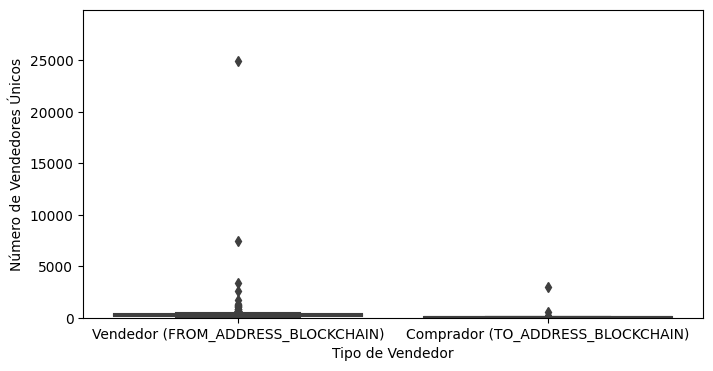

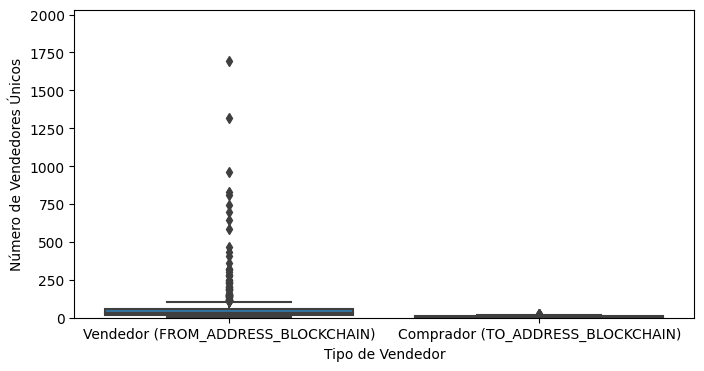

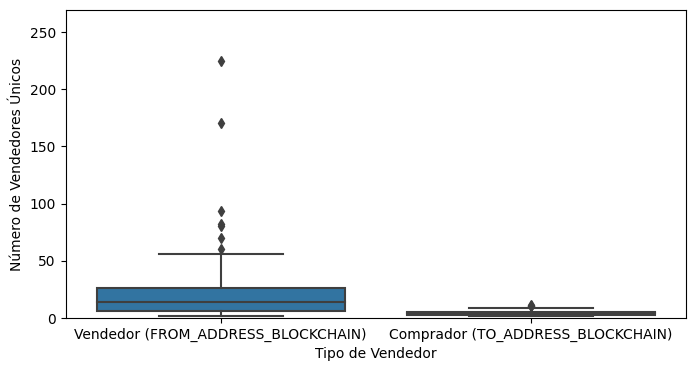

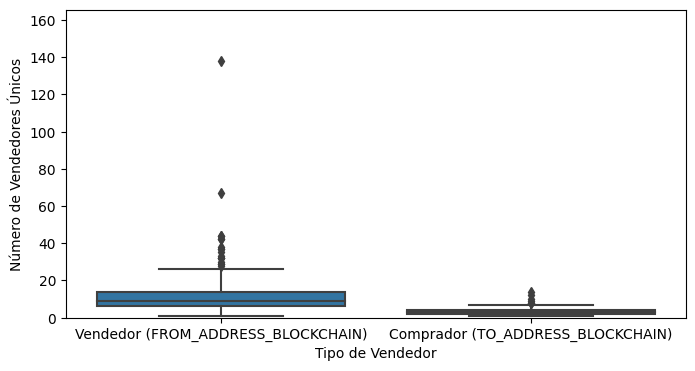

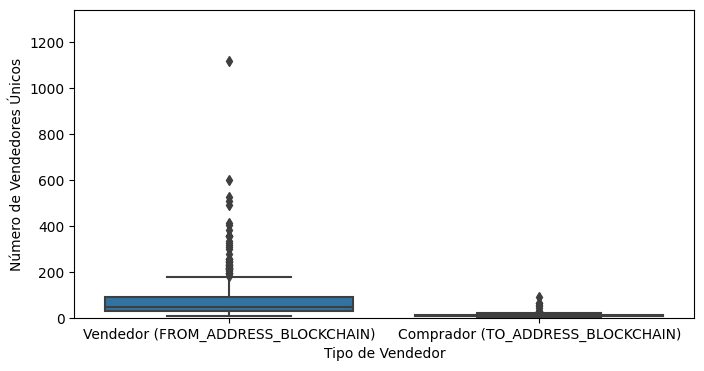

...

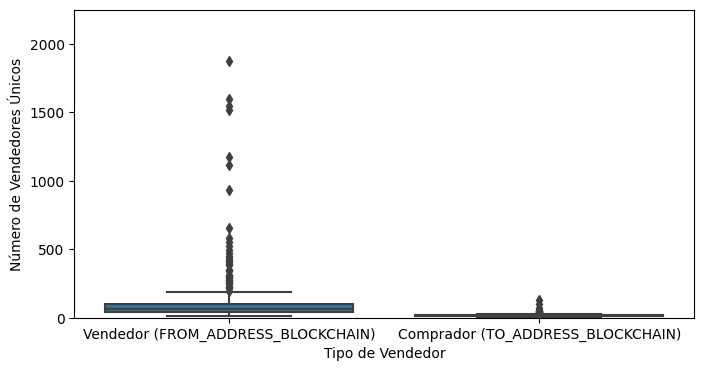

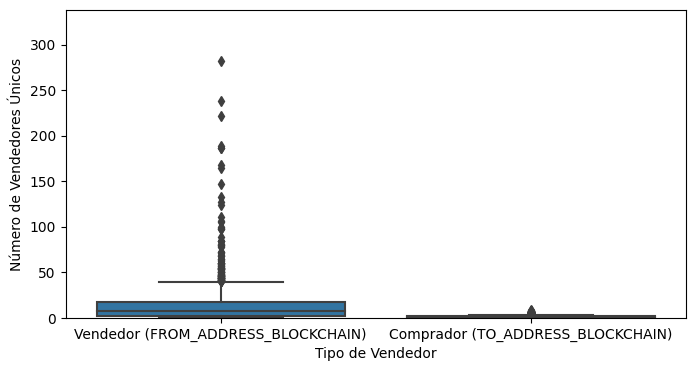

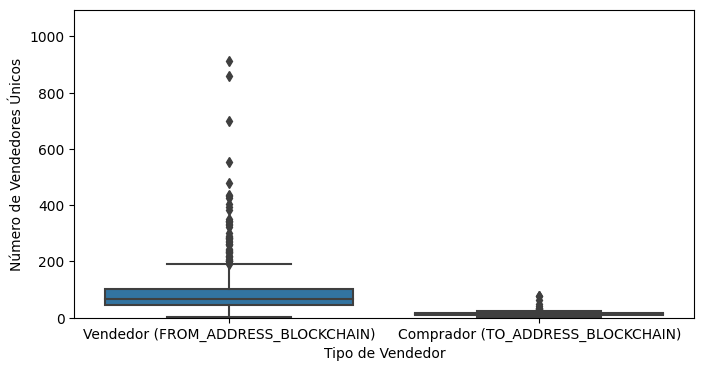

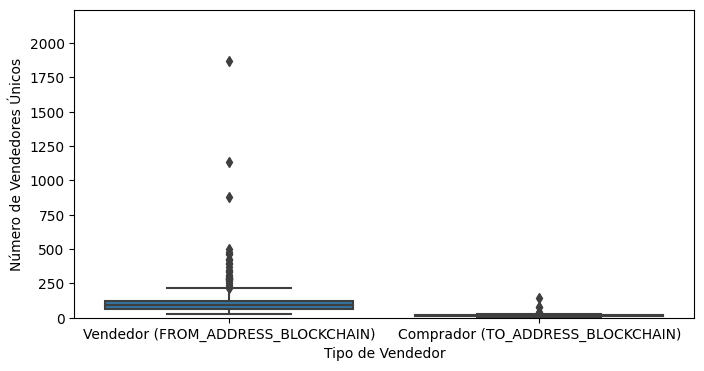

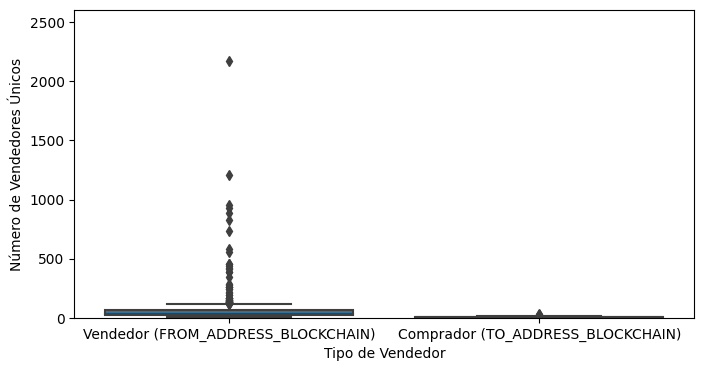

In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):
    # Criar uma lista com os valores da quantidade total de transações
    # Calculando a contagem diária de compradores únicos
    df_daily_count_from = list_df_blue[i].groupby('BLOCK_DATE')['FROM_ADDRESS_BLOCKCHAIN'].nunique()
    df_daily_count_to = list_df_blue[i].groupby('BLOCK_DATE')['TO_ADDRESS_BLOCKCHAIN'].nunique()

    # Definindo o tamanho da figura
    plt.figure(figsize=(8, 4))

    # Gerando o boxplot para as colunas FROM_ADDRESS_BLOCKCHAIN e TO_ADDRESS_BLOCKCHAIN
    sns.boxplot(data=[df_daily_count_from, df_daily_count_to], orient='v')

    # Definindo os rótulos do eixo x e y
    plt.xlabel('Tipo de Vendedor')
    plt.ylabel('Número de Vendedores Únicos')

    # Definindo a escala do eixo y
    plt.ylim(0, max(max(df_daily_count_from), max(df_daily_count_to))*1.2)

    # Definindo as etiquetas do eixo x
    plt.xticks([0, 1], ['Vendedor (FROM_ADDRESS_BLOCKCHAIN)', 'Comprador (TO_ADDRESS_BLOCKCHAIN)'])

    # Exibindo o gráfico
    plt.show()

Histograma representando a quantidade de transações ao longo das datas do dataframe,

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


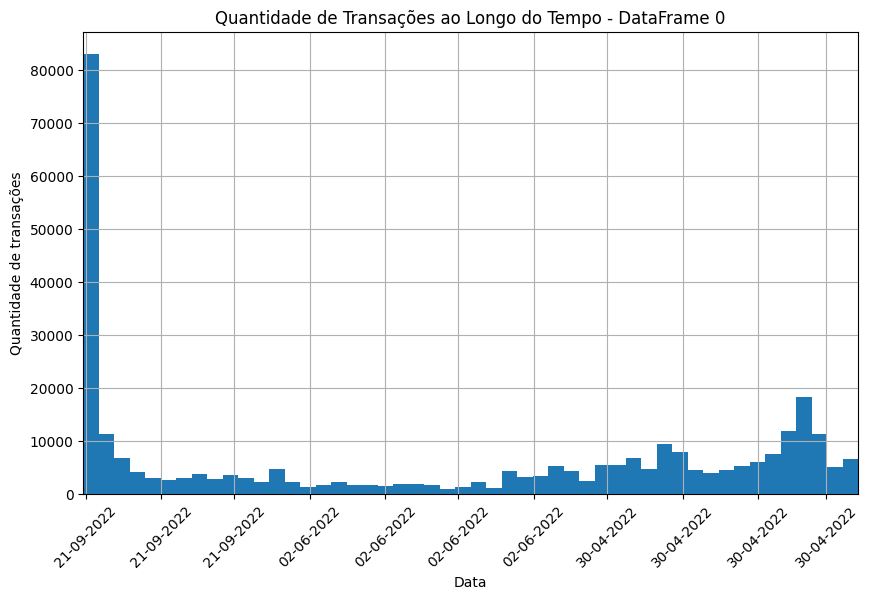

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


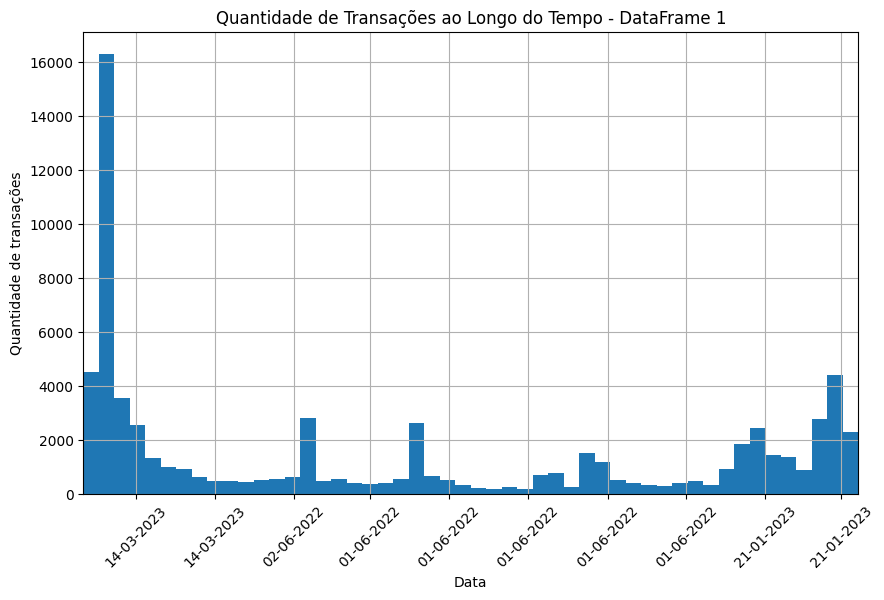

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


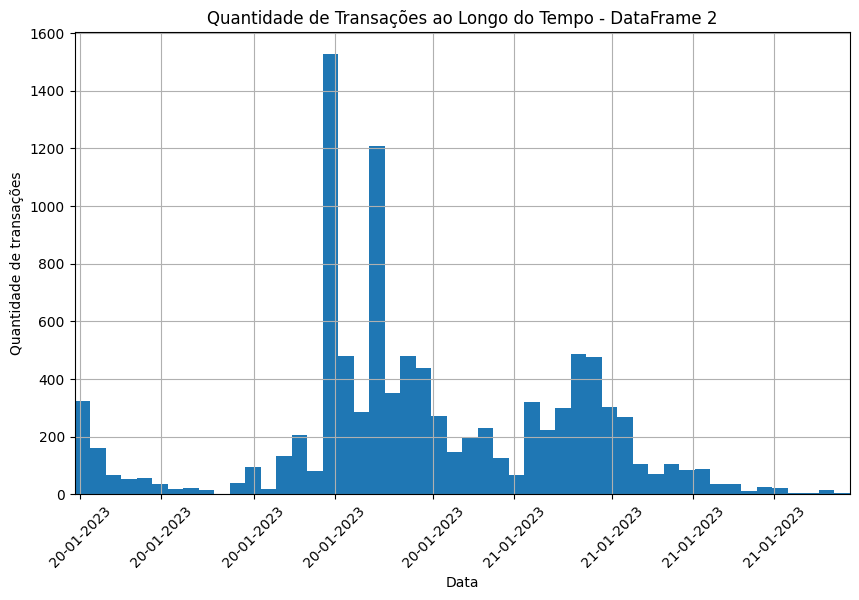

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


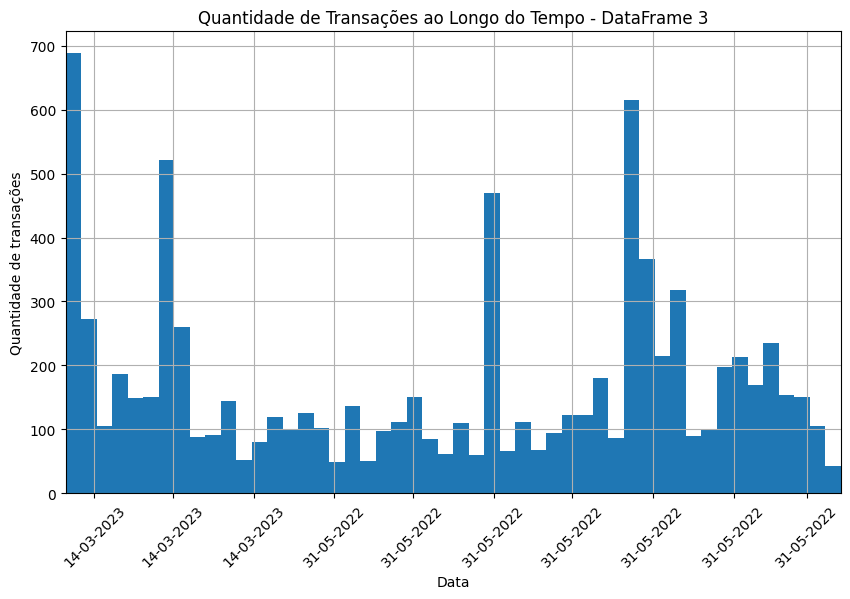

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


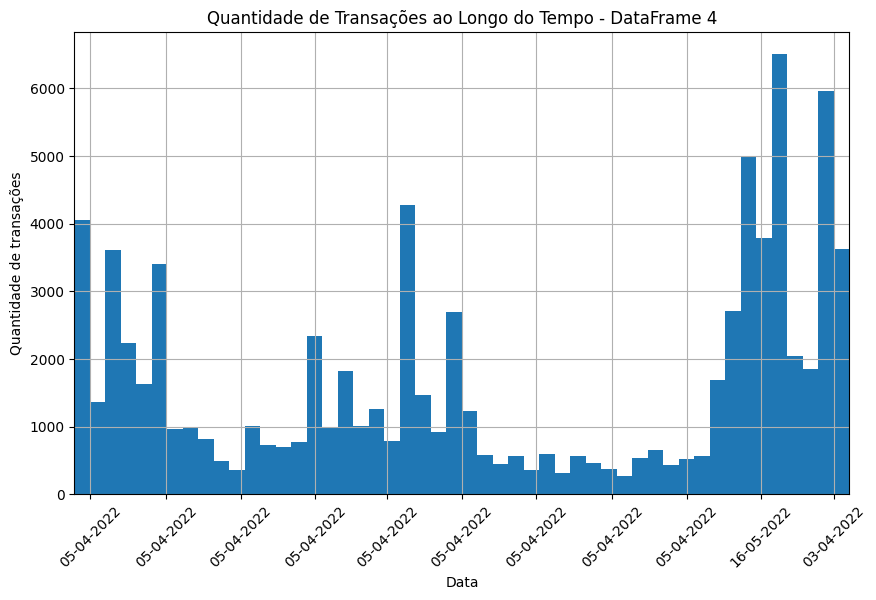

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


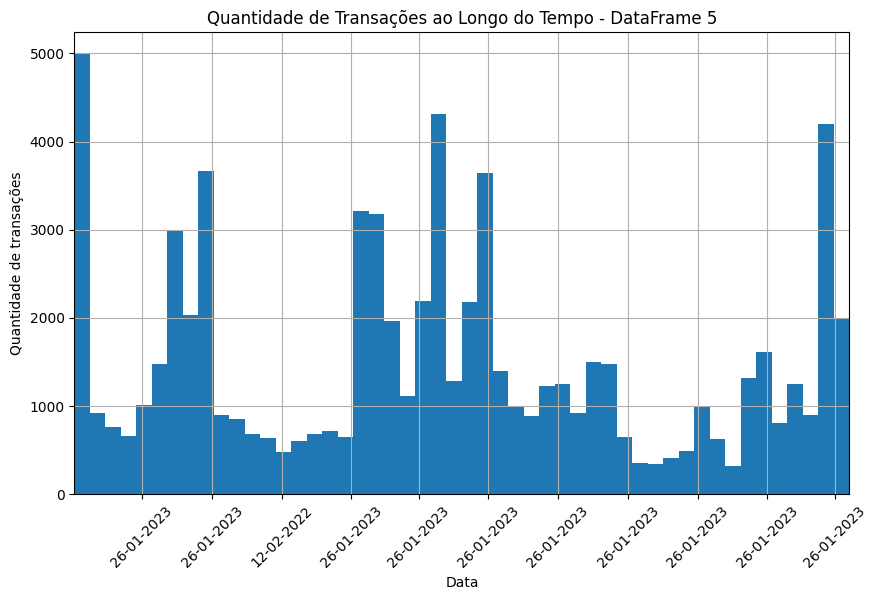

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


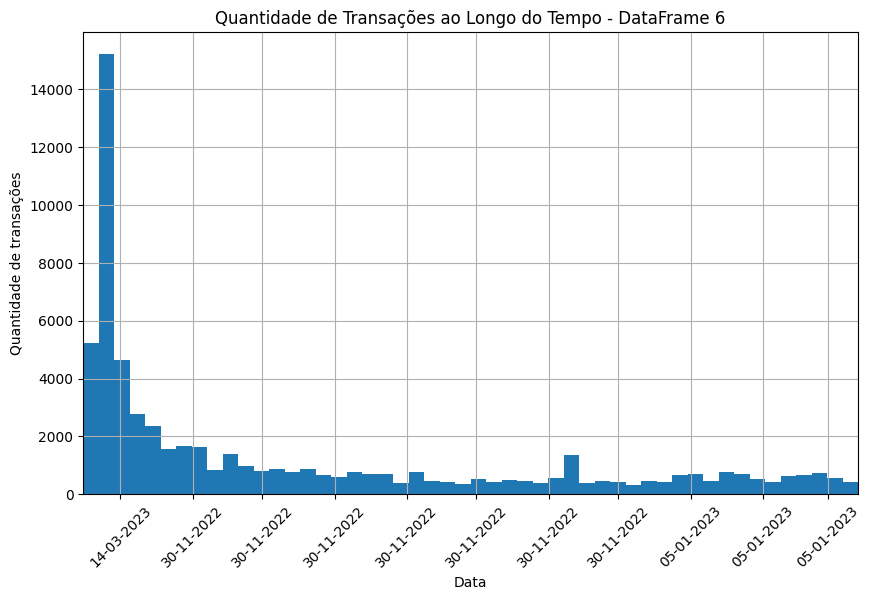

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


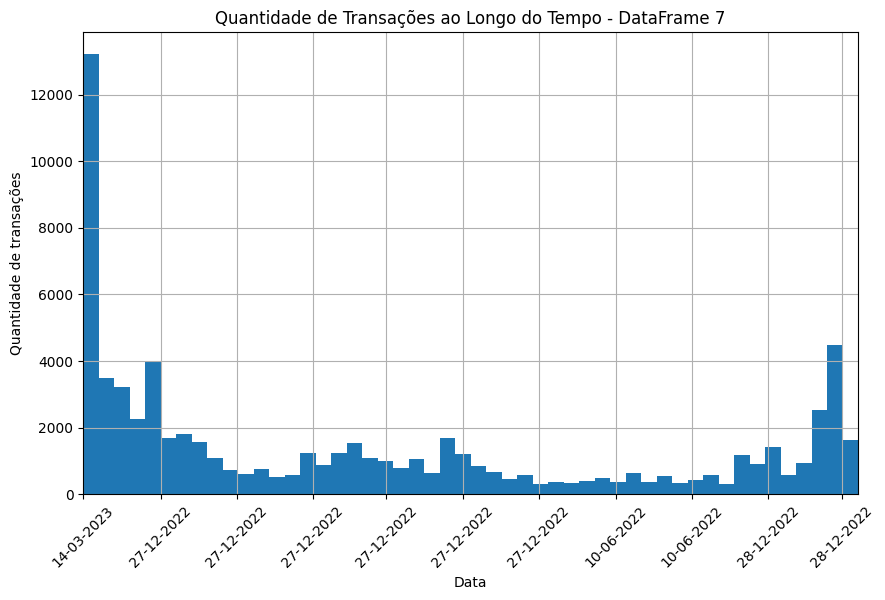

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


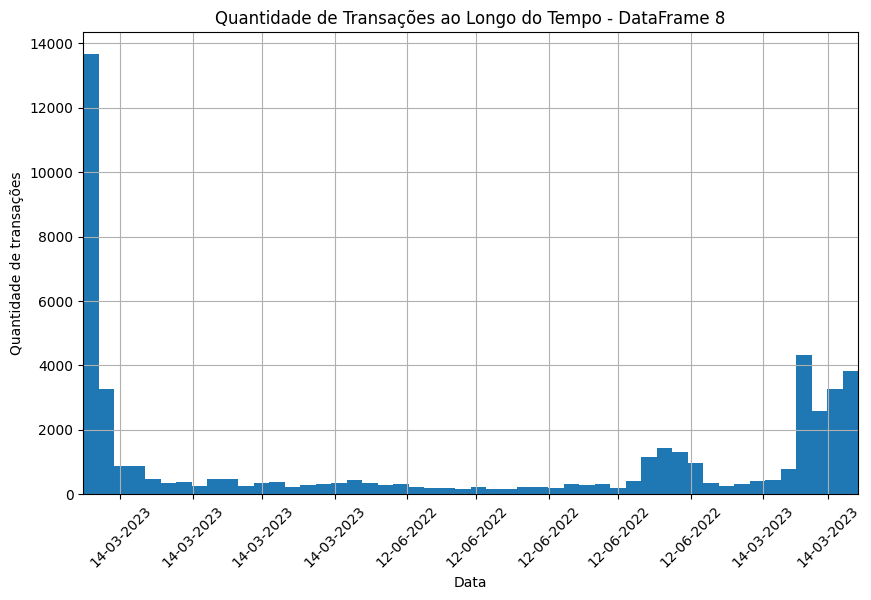

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


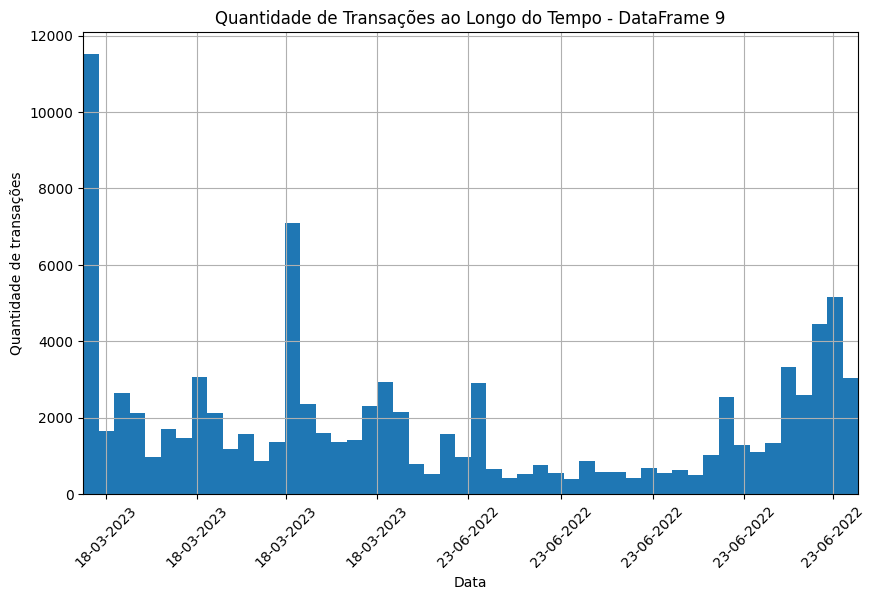

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


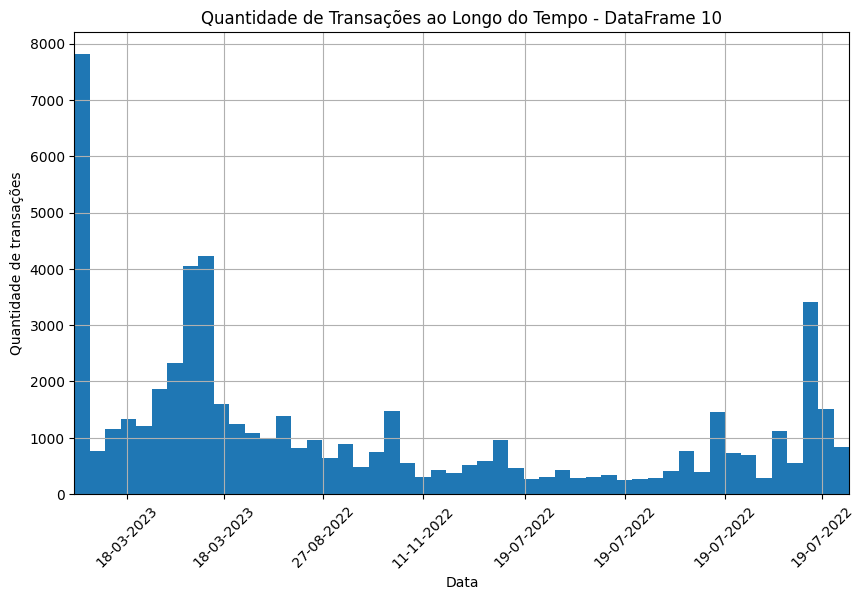

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


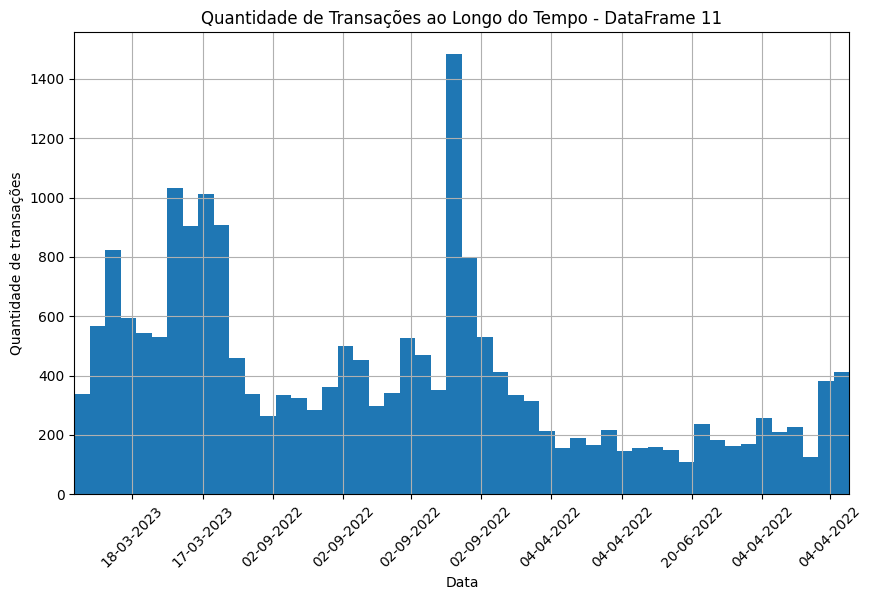

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


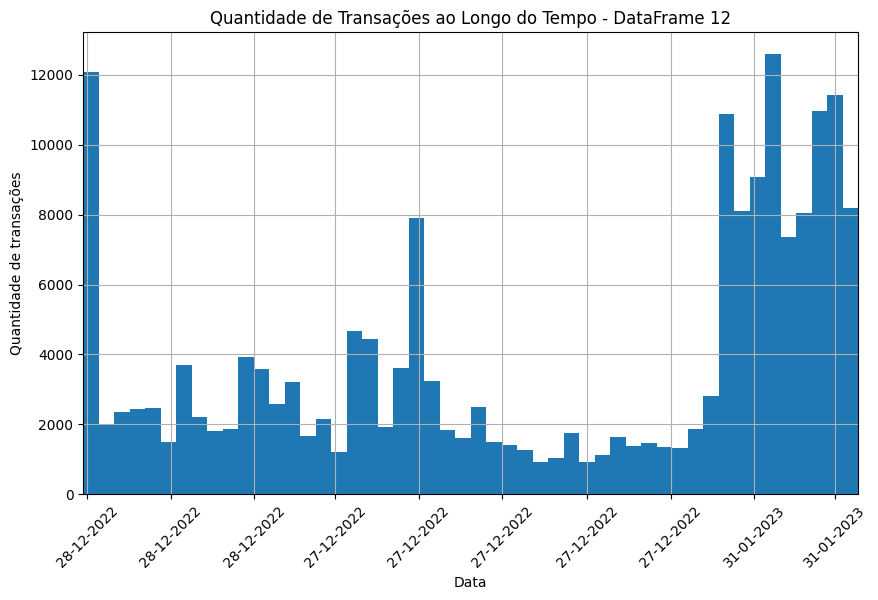

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


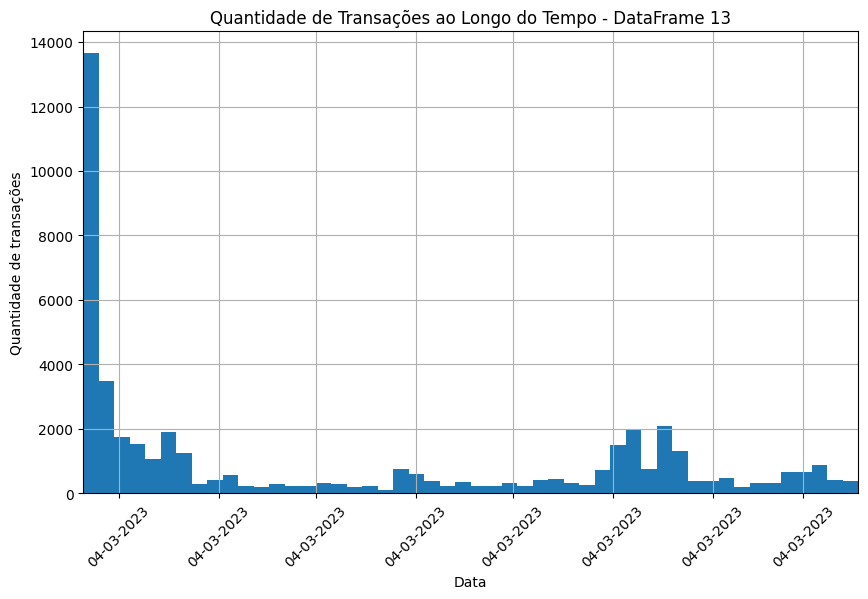

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


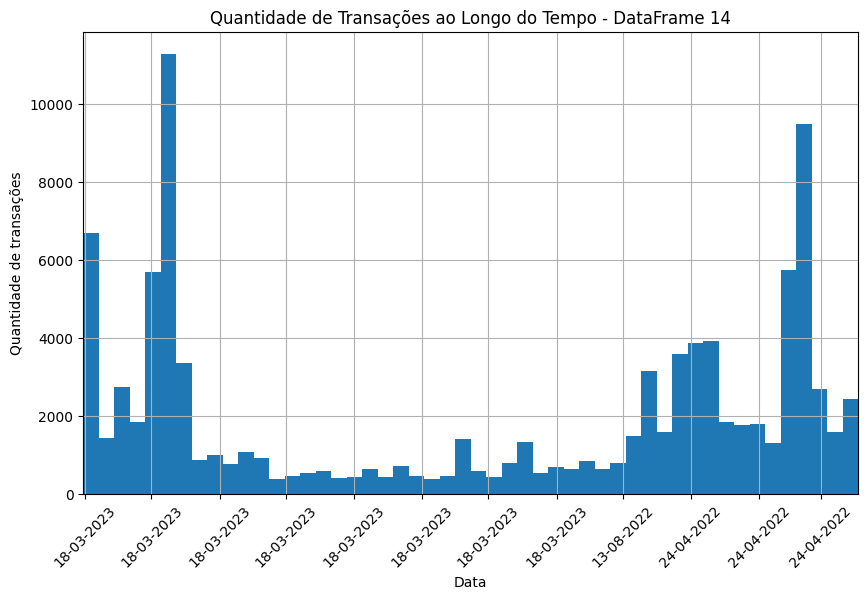

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


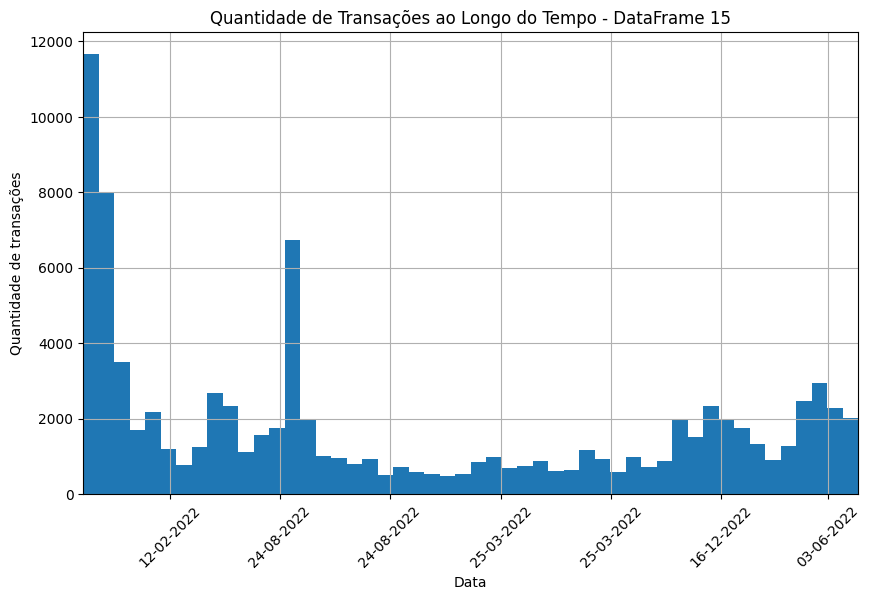

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


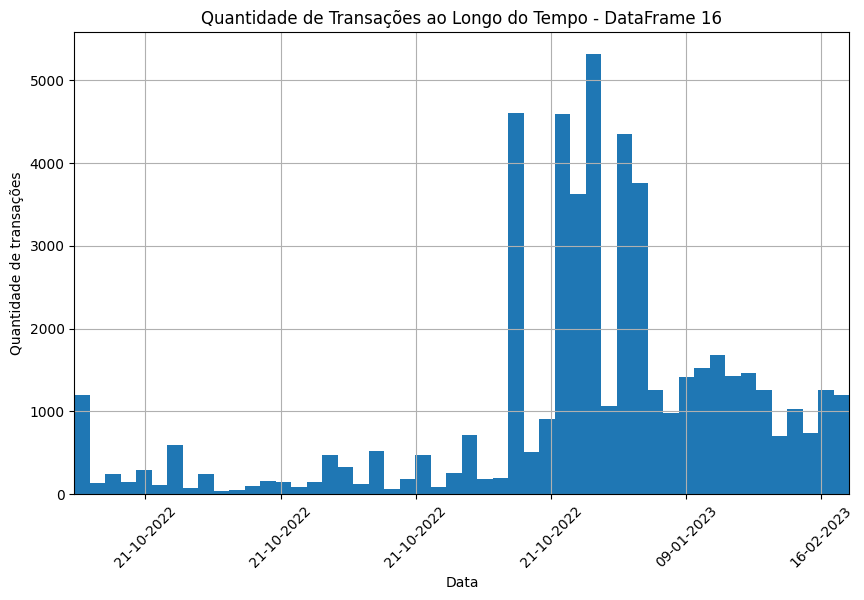

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


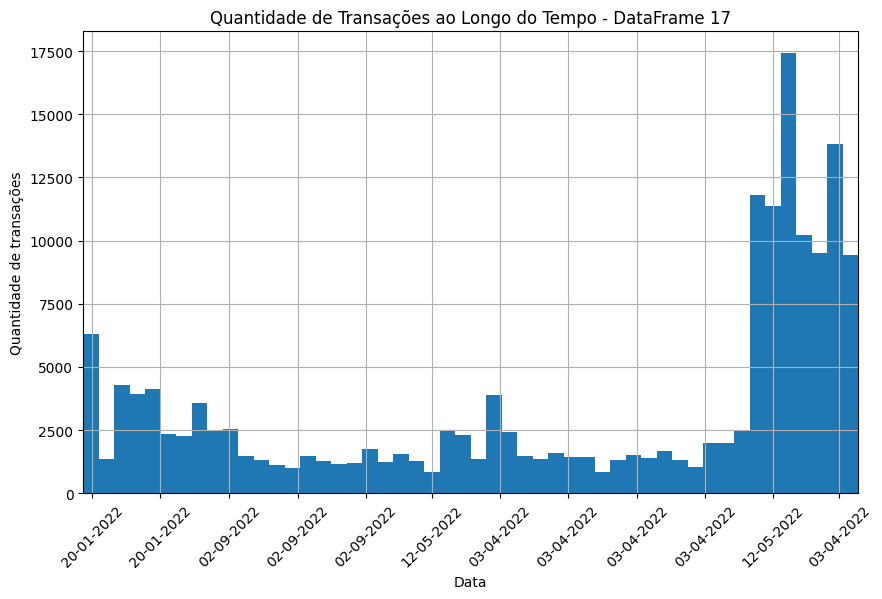

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


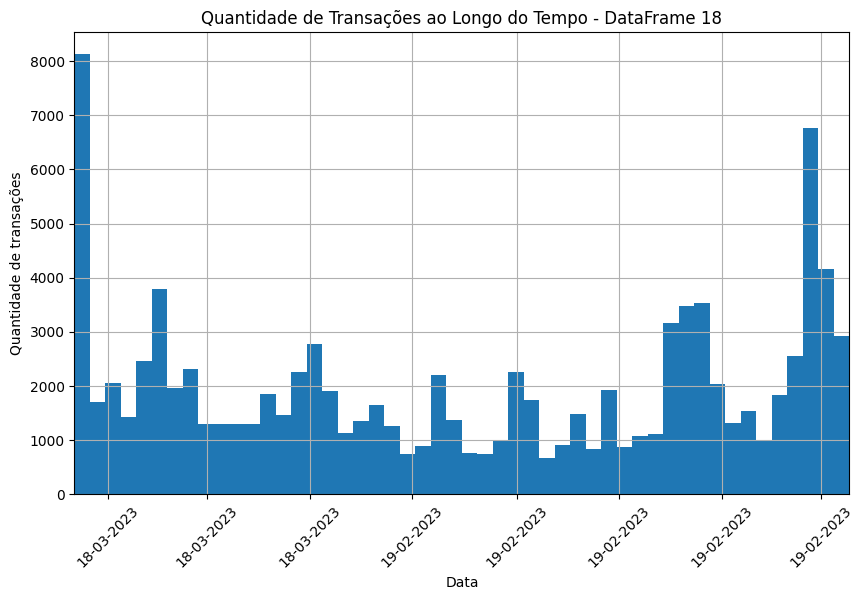

<ipython-input-35-cd2246104da9>:24: UserWarning: FixedFormatter should only be used together with FixedLocator


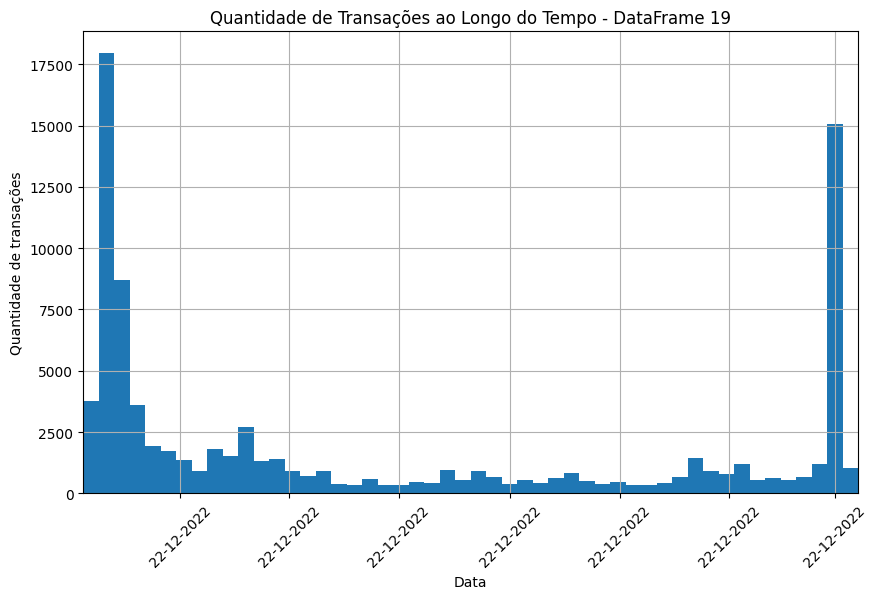

In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):

  # Definindo o tamanho da figura
  plt.figure(figsize=(10, 6))

  plt.title('Quantidade de Transações ao Longo do Tempo - DataFrame ' + str(i))

  # Girando os rótulos do eixo X em 45 graus
  plt.xticks(rotation=45)

  # Criando o histograma
  list_df_blue[i]['BLOCK_DATE'].hist(bins=50)

  # Definindo os rótulos do eixo x e y
  plt.xlabel('Data')
  plt.ylabel('Quantidade de transações')

  # Definindo os limites do eixo X
  plt.xlim(list_df_blue[i]['BLOCK_DATE'].min(), list_df_blue[i]['BLOCK_DATE'].max())

  # Formatar as datas no eixo x
  list_df_blue[i]['BLOCK_DATE'] = pd.to_datetime(list_df_blue[i]['BLOCK_DATE'])
  plt.gca().xaxis.set_major_formatter(plt.FixedFormatter(list_df_blue[i]['BLOCK_DATE'].dt.strftime('%d-%m-%Y')))


  # Exibindo o gráfico
  plt.show()


In [ ]:
list_df_blue[0]['BLOCK_DATE'].nunique()

319

In [ ]:
list_df_blue[0]['BLOCK_DATE'].value_counts()

2022-05-01    53027
2022-05-02    14089
2022-05-03     5859
2023-02-16     5725
2022-05-04     4649
              ...  
2022-09-25      146
2022-10-16      139
2022-09-24      124
2022-04-30       81
2023-03-14       48
Name: BLOCK_DATE, Length: 319, dtype: int64

Plotar um gráfico de uma série temporal de contagem diária de vendedores únicos. Ele define o tamanho da figura do gráfico, plota a série temporal, define os rótulos dos eixos x e y, altera a escala do eixo y para logarítmica, define os ticks e rótulos dos eixos x e y e exibe o gráfico final.

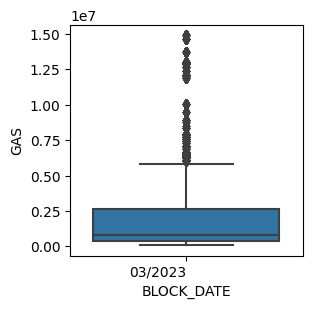

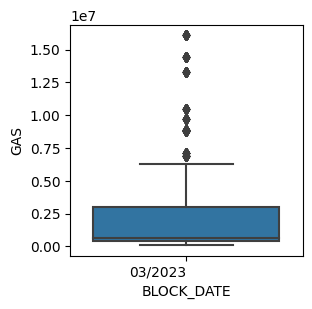

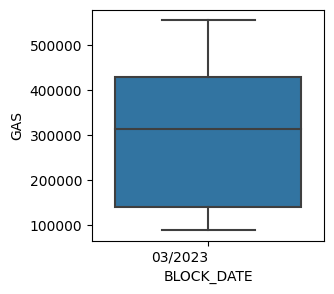

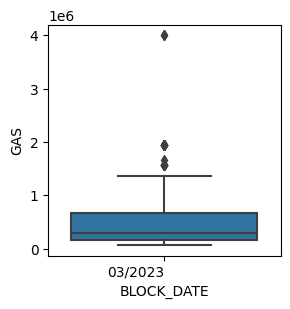

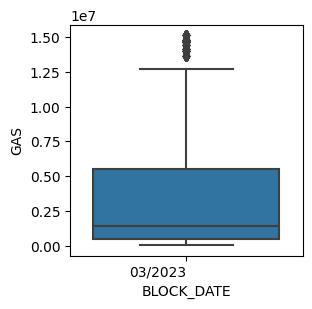

...

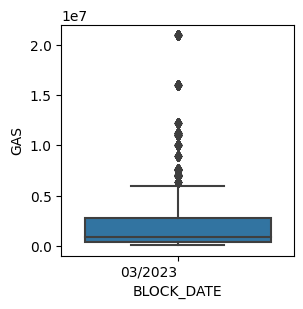

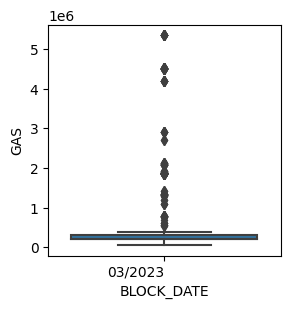

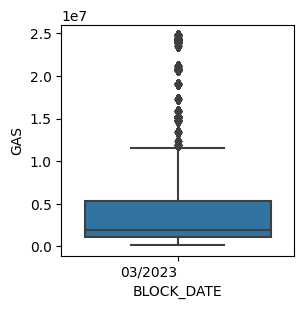

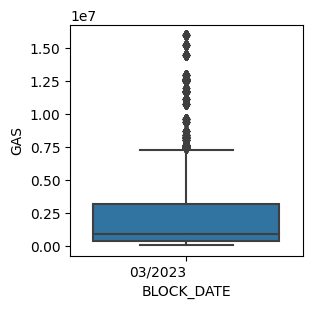

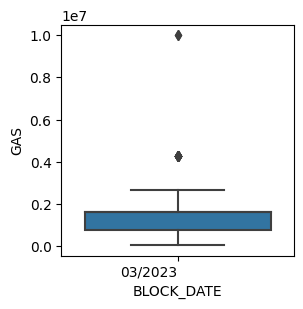

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Certifique-se de que 'BLOCK_DATE' seja do tipo datetime
for i, df in enumerate(list_df_blue):
    df['BLOCK_DATE'] = pd.to_datetime(df['BLOCK_DATE'])

    # Filtra o DataFrame para incluir apenas o mês de março de 2023
    df_marco_2023 = df[df['BLOCK_DATE'].dt.month == 3]
    df_marco_2023 = df_marco_2023[df_marco_2023['BLOCK_DATE'].dt.year == 2023]

    # Crie um boxplot para o mês de março de 2023
    plt.figure(figsize=(3, 3))
    sns.boxplot(x=df_marco_2023['BLOCK_DATE'].dt.strftime('%m/%Y'), y='GAS', data=df_marco_2023, palette='tab10')
#    plt.title(f"Boxplot Mensal do GAS - DataFrame {i} (Março/2023)")
#    plt.xlabel("Mês/Ano")
    plt.ylabel("GAS")
    plt.yscale('linear')  # Garante que a escala do eixo y seja linear
    plt.xticks(ha='right')  # Rotaciona os rótulos do eixo x
    plt.show()


In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):

  # Define a coluna BLOCK_TIMESTAMP como o índice do DataFrame
  list_df_blue[i].set_index('BLOCK_TIMESTAMP', inplace=True)

  # Cria uma série temporal com base na coluna VALUE
  serie_temporal_gas = list_df_blue[i]['GAS']

In [ ]:
# Exibe a série temporal
print('Lines: {}'.format(serie_temporal_gas.shape[0]))
# print('Columns: {}'.format(serie_temporal.shape[1]))
print(serie_temporal_gas)

Lines: 87095
BLOCK_TIMESTAMP
2022-12-22 20:58:47+00:00    136216
2022-12-22 16:16:23+00:00    153655
2022-12-22 11:37:59+00:00    155260
2022-12-22 16:18:47+00:00    153707
2022-12-22 22:51:35+00:00    159657
                              ...  
2022-09-11 23:56:31+00:00    117476
2022-09-11 23:13:55+00:00    196998
2022-09-11 21:30:08+00:00    100376
2022-09-11 21:35:42+00:00    116679
2022-09-11 20:25:44+00:00     40730
Name: GAS, Length: 87095, dtype: int64


In [ ]:
# create an auxiliar dataframe to analyse missing data
cons = pd.DataFrame({
                    'type': df.dtypes,
                    'missing' : df.isna().sum(),
                    'size' : df.shape[0],
                    'unique': df.nunique()})
cons['percentual'] = round(cons['missing'] / cons['size'],2)

In [ ]:
cons

,type,missing,size,unique,percentual
ADDRESS_BLUE,object,0,87095,1,0.0
BLOCK_TIMESTAMP_BLUE,object,0,87095,1,0.0
FROM_ADDRESS,object,0,87095,10721,0.0
TO_ADDRESS,object,0,87095,10025,0.0
VALUE,int64,0,87095,11108,0.0
TRANSACTION_HASH,object,0,87095,50548,0.0
NONCE,int64,0,87095,3236,0.0
FROM_ADDRESS_BLOCKCHAIN,object,0,87095,9728,0.0
TO_ADDRESS_BLOCKCHAIN,object,0,87095,460,0.0
GAS,int64,0,87095,9095,0.0


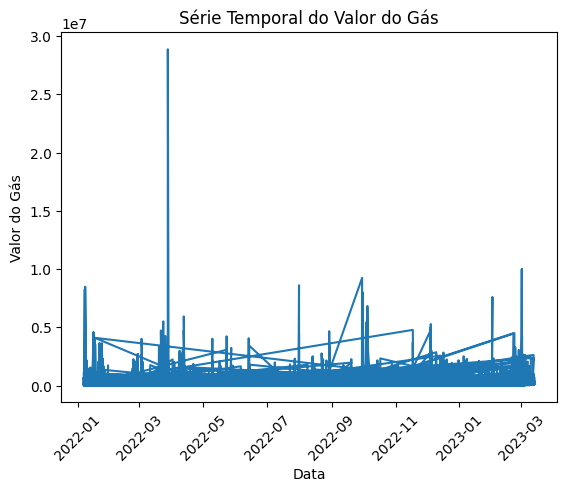

In [ ]:
import matplotlib.pyplot as plt

# Plotar o gráfico da série temporal
plt.plot(serie_temporal_gas)

# Girando os rótulos do eixo X em 45 graus
plt.xticks(rotation=45)
plt.xlabel('Data')
plt.ylabel('Valor do Gás')
plt.title('Série Temporal do Valor do Gás')
plt.show()


In [ ]:
# Calcular medidas estatísticas descritivas
media = serie_temporal_gas.mean()
mediana = serie_temporal_gas.median()
desvio_padrao = serie_temporal_gas.std()
minimo = serie_temporal_gas.min()
maximo = serie_temporal_gas.max()

print('Média:', media)
print('Mediana:', mediana)
print('Desvio Padrão:', desvio_padrao)
print('Mínimo:', minimo)
print('Máximo:', maximo)


Média: 671165.134531259
Mediana: 242695.0
Desvio Padrão: 946770.5247983085
Mínimo: 35355
Máximo: 28873056


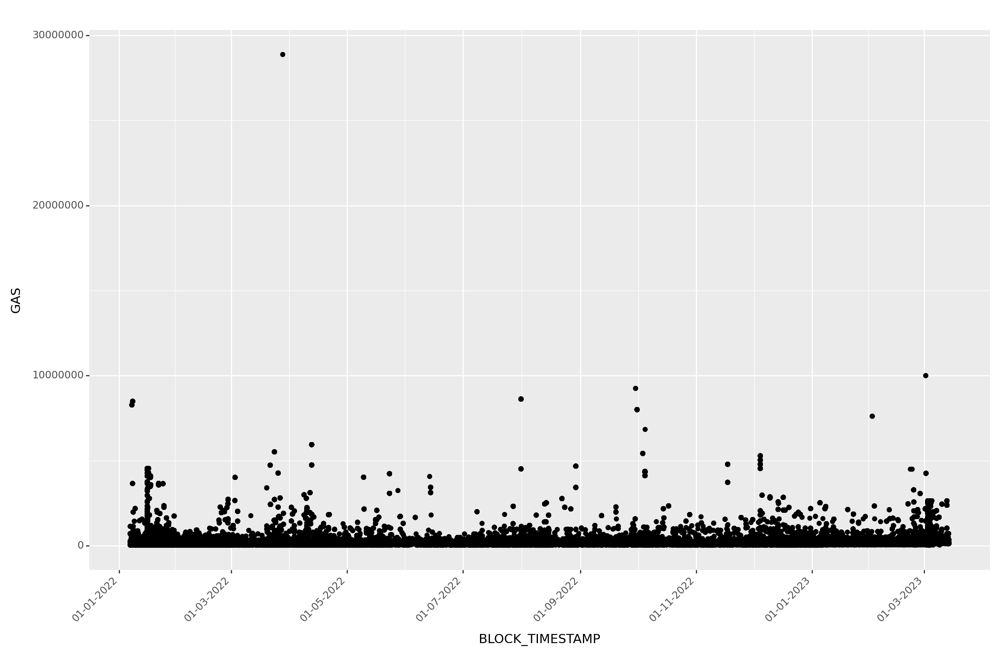

<Figure Size: (1200 x 800)>

In [ ]:
from plotnine import ggplot, aes, geom_point, scale_x_datetime, theme, element_text

# Transforma a série temporal em um DataFrame
df2 = pd.DataFrame({'BLOCK_TIMESTAMP': serie_temporal_gas.index, 'GAS': serie_temporal_gas.values})

# Cria o gráfico de dispersão com o eixo x formatado como data e tamanho aumentado
(ggplot(df2, aes(x='BLOCK_TIMESTAMP', y='GAS'))
 + geom_point()
 + scale_x_datetime(date_labels='%d-%m-%Y')
 + theme(axis_text_x=element_text(rotation=45, hjust=1), figure_size=(12, 8))  # Define o tamanho do gráfico e gira os rótulos do eixo x em 45 graus
)


In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):
  # Cria uma série temporal com base na coluna VALUE
  serie_temporal2 = list_df_blue[i][['GAS','RECEIPT_GAS_USED']]

  # Exibe a série temporal
  print('Lines: {}'.format(serie_temporal2.shape[0]))
  print('Columns: {}'.format(serie_temporal2.shape[1]))
  print(serie_temporal2)

Lines: 307667
Columns: 2
                              GAS  RECEIPT_GAS_USED
BLOCK_TIMESTAMP                                    
2022-09-21 00:26:11+00:00  171194            130662
2022-09-21 23:08:11+00:00  400000            263036
2022-09-21 23:08:11+00:00  400000            263036
2022-06-02 00:45:36+00:00  303593            244193
2022-06-02 07:20:15+00:00  534168            455692
...                           ...               ...
2022-09-14 12:06:54+00:00  454315            240548
2022-09-14 14:00:19+00:00  782760            512052
2022-09-14 08:09:07+00:00  757717            495357
2022-09-14 07:29:51+00:00  798219            522358
2022-09-14 08:11:51+00:00  798249            517578

[307667 rows x 2 columns]
Lines: 70613
Columns: 2
                              GAS  RECEIPT_GAS_USED
BLOCK_TIMESTAMP                                    
2023-03-14 02:09:35+00:00  235848            166851
2023-03-14 02:09:47+00:00  550724            376000
2022-06-02 06:22:46+00:00  145678       

* O método resample() é usado para calcular a média dos valores diários do DataFrame original (df). Em seguida, os pontos de referência para o eixo x são definidos como o índice do novo DataFrame (df_resampled.index), que contém uma frequência menor de valores do que o DataFrame original.

In [ ]:
# Definindo a frequência de amostragem (no caso, diária)
freq = 'M'

# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):

  # Resample dos dados para a frequência definida
  df_resampled = list_df_blue[i].resample(freq).mean()

  # Definindo o tamanho da figura
  plt.figure(figsize=(15, 6))

  # Plotando os pontos de GAS
  plt.scatter(df_resampled.index, df_resampled['GAS'], s=50, c='blue')

  # Plotando os pontos de RECEIPT_GAS_USED
  plt.scatter(df_resampled.index, df_resampled['RECEIPT_GAS_USED'], s=50, c='red')

  # Definindo os rótulos do eixo x e y
  plt.xlabel('Data')
  plt.ylabel('Quantidade de GAS')

  # Definindo os ticks e rótulos do eixo x
  xticks = df_resampled.index
  plt.xticks(xticks, rotation=45, ha='right')

  # Exibindo o gráfico
  plt.show()

Output hidden; open in https://colab.research.google.com to view.

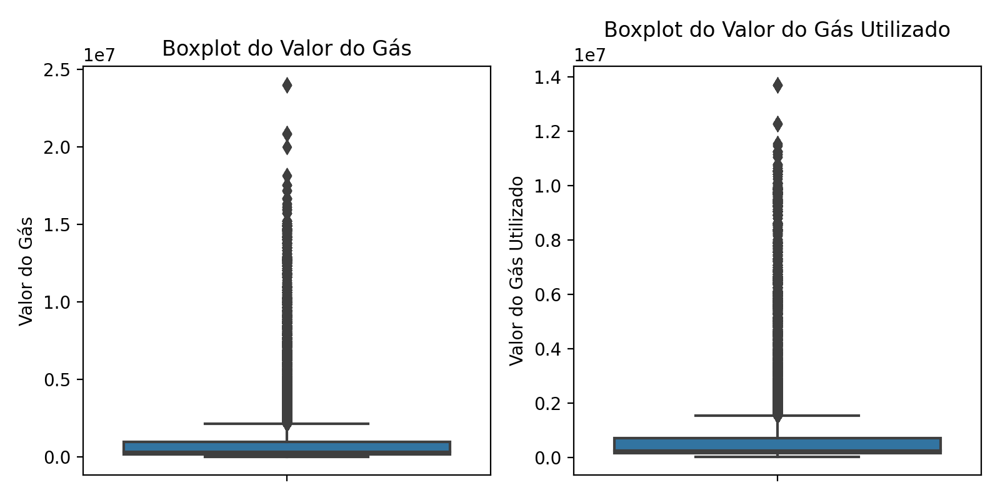

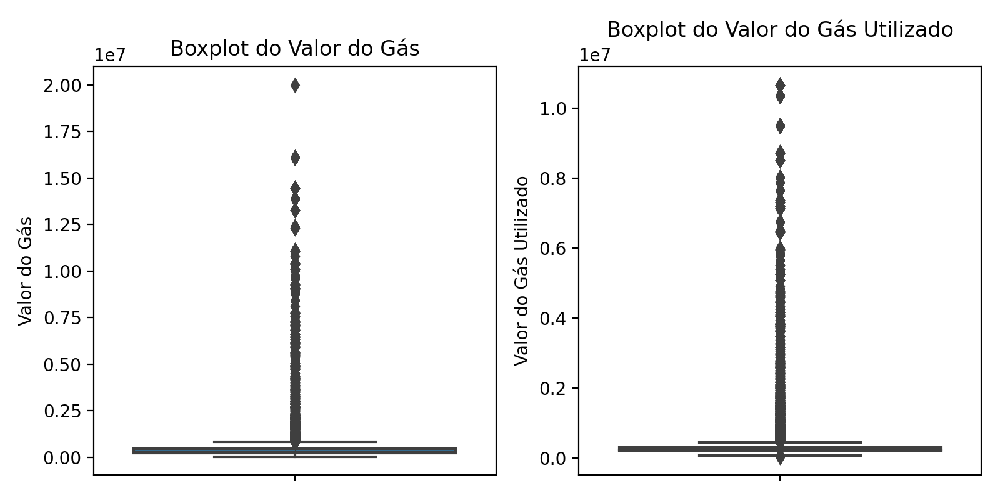

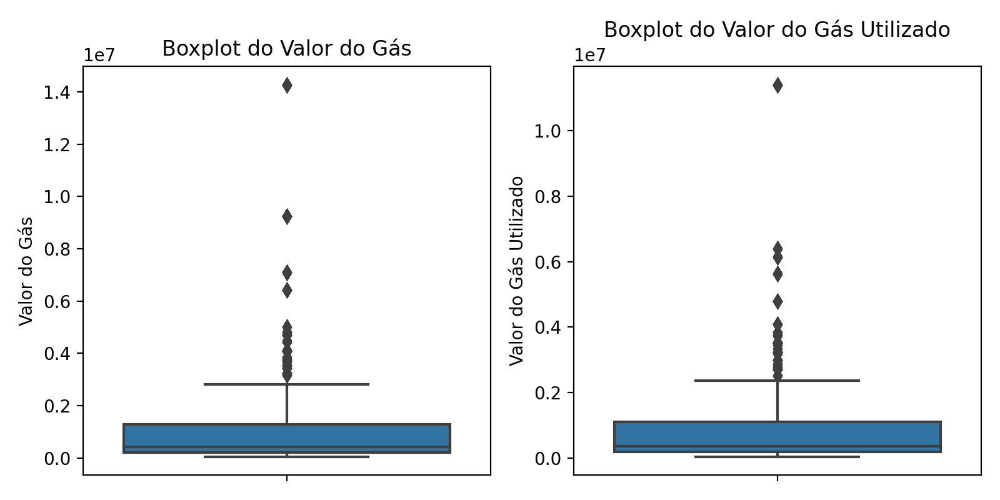

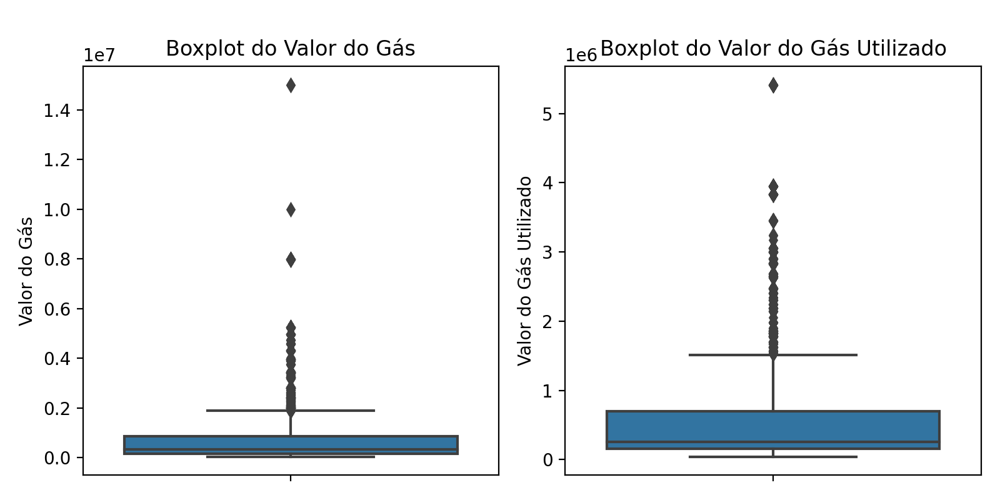

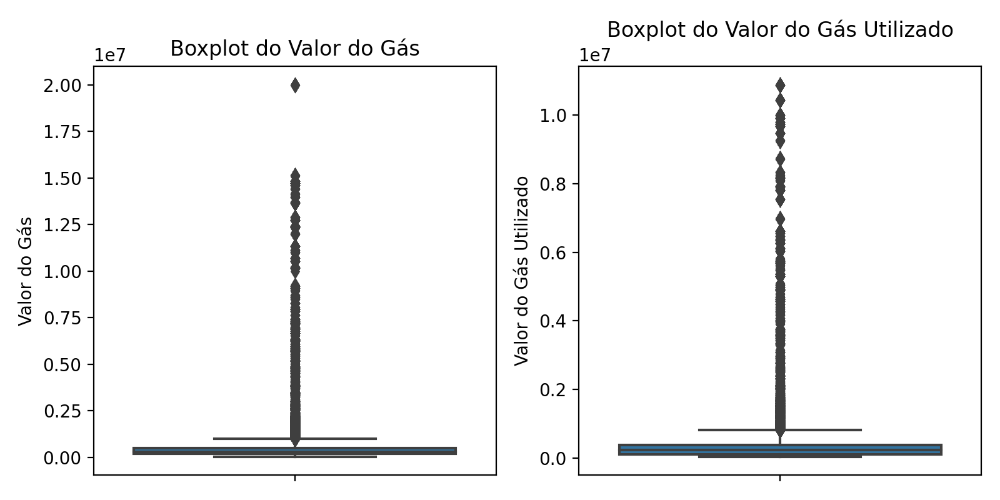

...

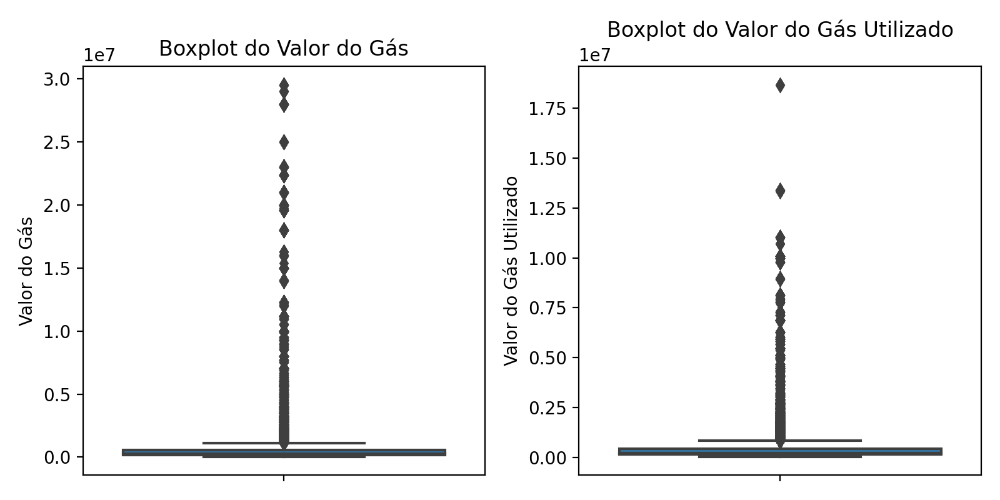

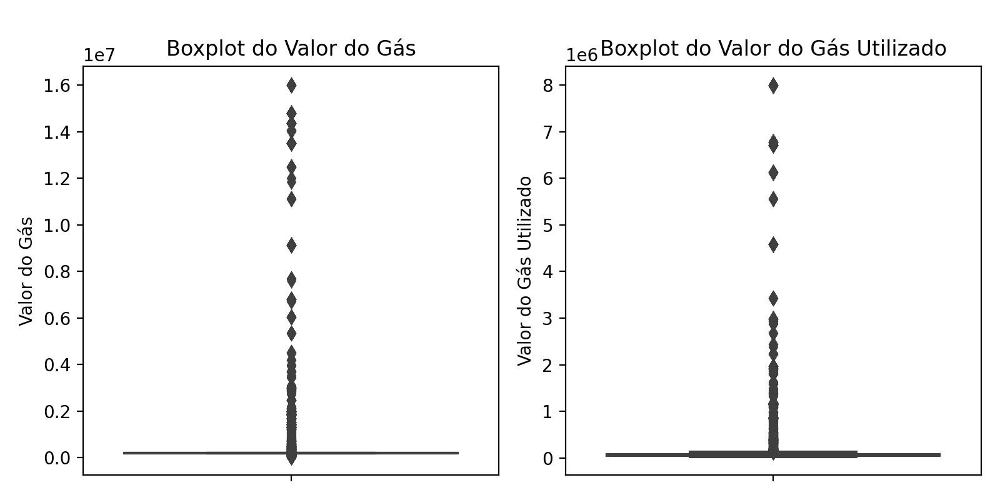

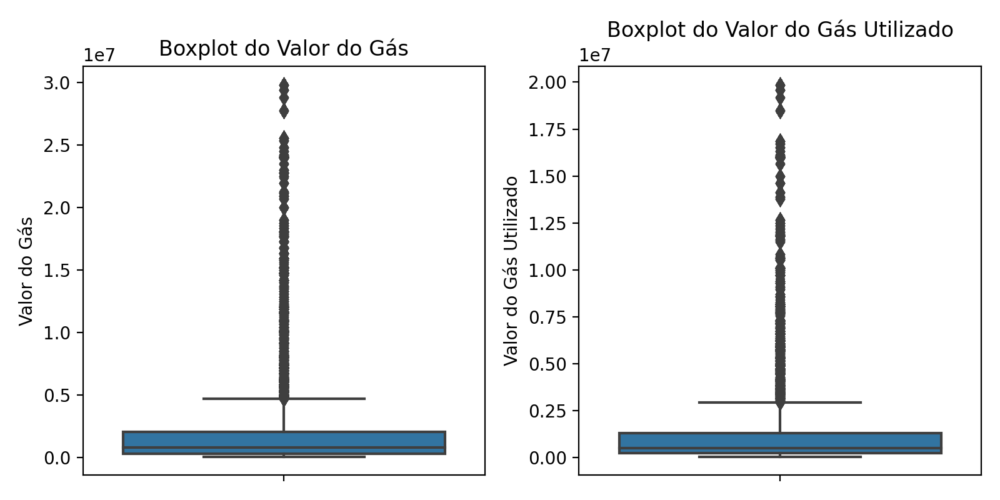

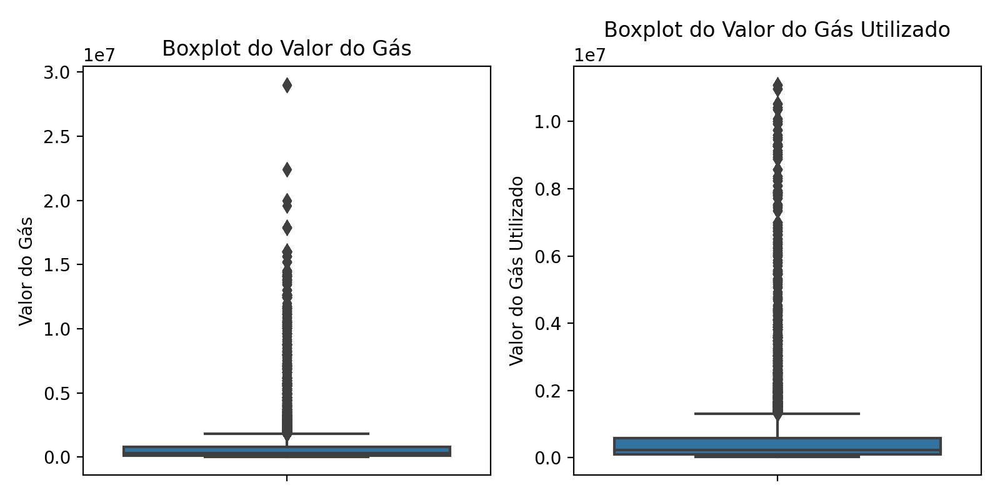

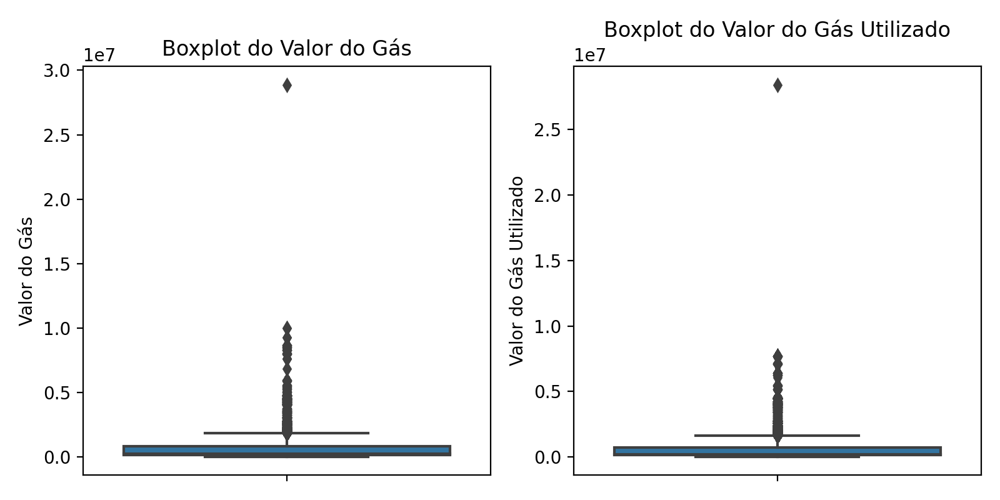

In [ ]:
# Iterar sobre os DataFrames
for i in range(len(list_df_blue)):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    sns.boxplot(data=list_df_blue[i], y='GAS', ax=ax[0])
    sns.boxplot(data=list_df_blue[i], y='RECEIPT_GAS_USED', ax=ax[1])

    ax[0].set_title('Boxplot do Valor do Gás')
    ax[0].set_ylabel('Valor do Gás')
    ax[1].set_title('Boxplot do Valor do Gás Utilizado')
    ax[1].set_ylabel('Valor do Gás Utilizado')

    plt.tight_layout()
    plt.show()
